# Imaging Performance Comparison (Active Region)
This notebook loops over different noise levels and calibration errors to generate, corrupt, image, and compare solar flare datasets.

In [1]:
import fasr_solar_simul as fss
import matplotlib
import numpy as np
from scipy.constants import c
import os
from casatasks import tclean, applycal, clearcal
from datetime import datetime
from pathlib import Path
from tqdm import tqdm
from astropy.time import Time
from sunpy import coordinates
from astropy.io import fits

# Speed of light in m/s
C_LIGHT = c
import matplotlib
%matplotlib inline

In [5]:
from importlib import reload

reload(fss)
target = 'Active_Region'
figsubfolder = 'figs/'
model_dir = '../fasr_sim/skymodels/active_region/AR_20210630_eofreq/'
model_prefix = 'AR_20210630_model_eofreq.'

## Set up the simulation

In [51]:
# List of all frequencies in GHz
freq_list = ['1.6GHz', '2GHz', '5GHz', '10GHz', '20GHz']
imsizes = [512, 512, 1024, 2048, 4096]
cells = ['4.8arcsec', '4.8arcsec', '2.4arcsec', '1.2arcsec', '0.6arcsec']
scales = [[0, 5, 10, 50], [0, 4, 10, 50], [0, 6, 20, 80, 160], [0, 5, 10, 40, 160], [0, 10, 40, 80, 320]]

selection = [0, 2, 3]
# Revise freq_list, imsizes, cells, and scales using the selection
freq_list = [freq_list[i] for i in selection]
imsizes = [imsizes[i] for i in selection]
cells = [cells[i] for i in selection]
scales = [scales[i] for i in selection]


# List of configurations
project = 'FASR-A'
#config_files = ['fasr_Log_Spiral-168.cfg', 'fasr-a_random_spiral_hybrid_120.cfg']
config_files = ['fasr-a_random_spiral_hybrid_120.cfg']

## Antenna temperature noise levels
tsys_all = [300.]

## Define the fractional gain errors tuples: (phase and amplitude)
# 6 degrees (or 1.7% of phase error is equivalent to 10% of amplitude error )
cal_errors = [(0.1, 0.1)]

# Define channel width and integration time
channel_width_mhz = 24. # channel width in MHz
integration_time = 1. # Time per integration in seconds
duration = 1. # Total imaging duration in seconds

# Reference timestamp for the observation series
reftime='2021-06-30T18:30:00'
solar_radius_asec = coordinates.sun.angular_radius(reftime).value

# Flags to control overwriting existing data products
overwrite_ms   = False  # Overwrite measurement set?
overwrite_im   = False  # Overwrite image products?
overwrite_plot = True  # Overwrite existing plots?

weighting = 'uniform'
# Deconvolution algorithm choice
#deconvolver = 'hogbom'
#niter = 0

deconvolver = 'multiscale'
niter = 10000
 

## Mask Models based on background levels

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0002 Jy/pixel at 1.26 GHz
Background level at 1.26 GHz: 0.0007 Jy/pixel


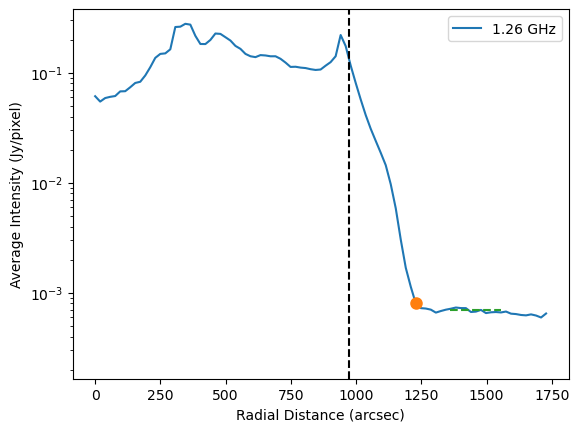

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.01.26GHz.I.masked.fits (RADCUT=1228.80 arcsec)


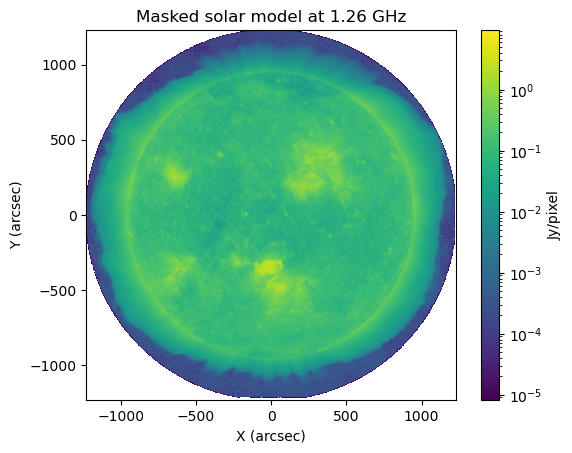

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0003 Jy/pixel at 1.59 GHz
Background level at 1.59 GHz: 0.0011 Jy/pixel


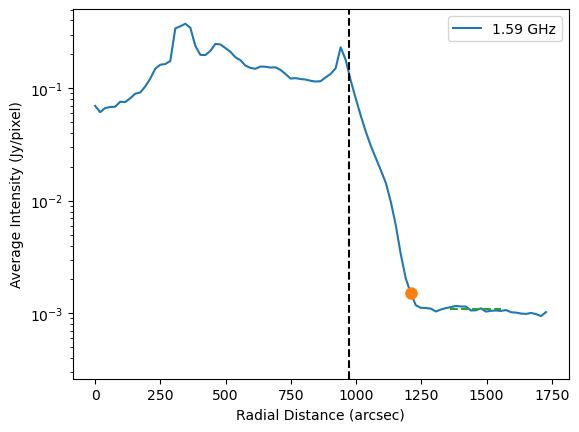

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.01.59GHz.I.masked.fits (RADCUT=1209.60 arcsec)


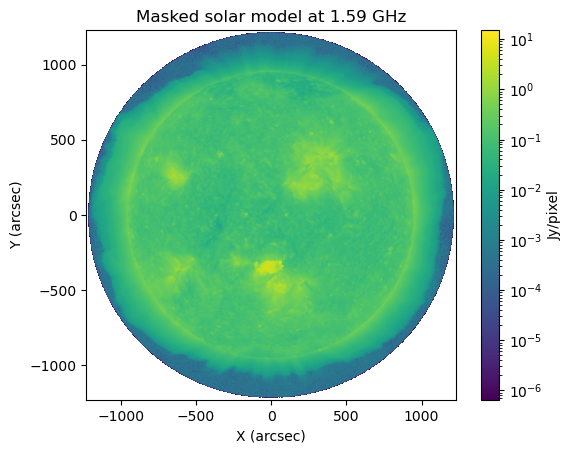

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0004 Jy/pixel at 1.91 GHz
Background level at 1.91 GHz: 0.0016 Jy/pixel


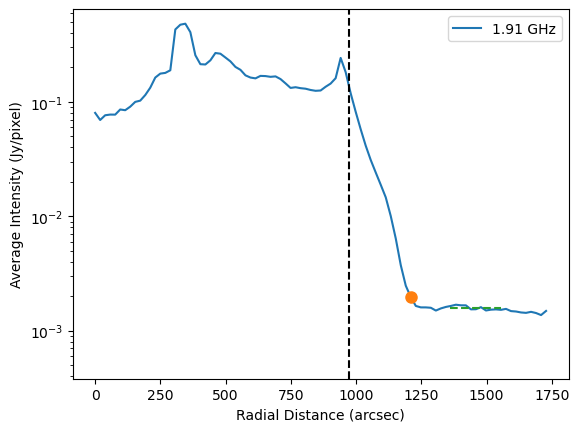

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.01.91GHz.I.masked.fits (RADCUT=1209.60 arcsec)


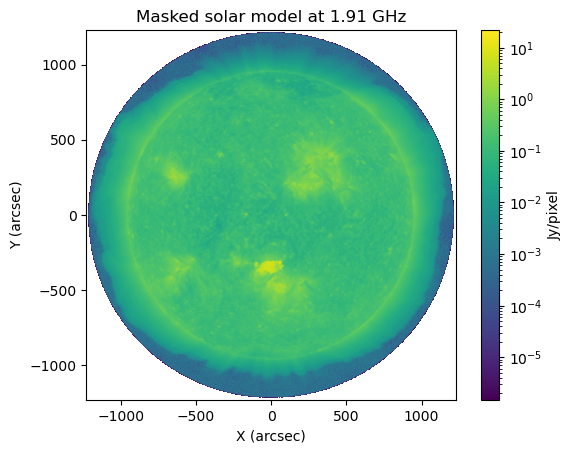

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0005 Jy/pixel at 2.24 GHz
Background level at 2.24 GHz: 0.0022 Jy/pixel


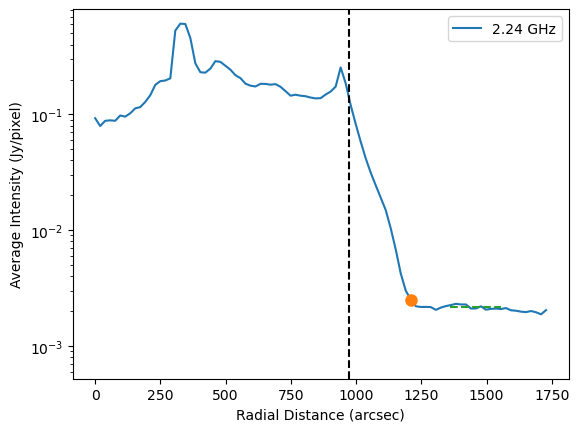

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.02.24GHz.I.masked.fits (RADCUT=1209.60 arcsec)


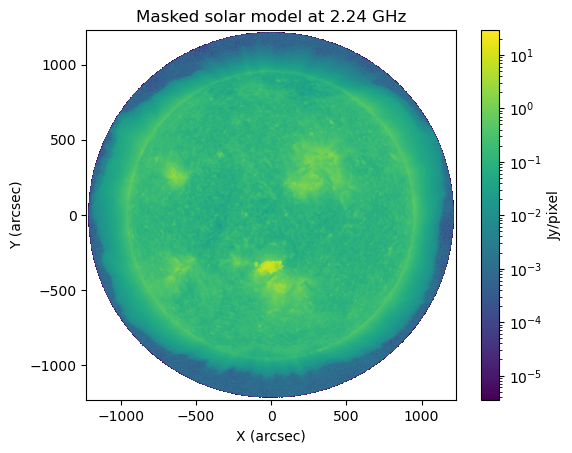

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0007 Jy/pixel at 2.56 GHz
Background level at 2.56 GHz: 0.0028 Jy/pixel


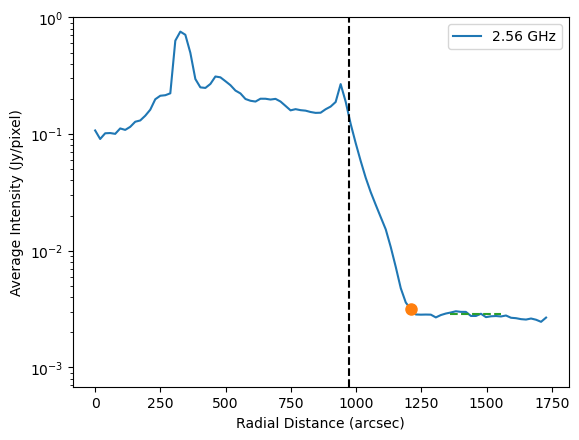

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.02.56GHz.I.masked.fits (RADCUT=1209.60 arcsec)


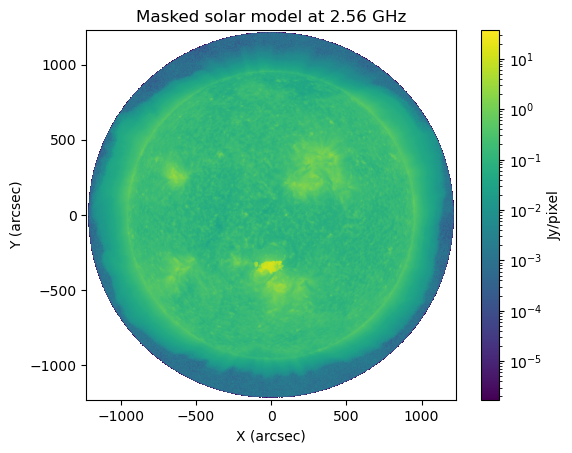

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0009 Jy/pixel at 2.89 GHz
Background level at 2.89 GHz: 0.0036 Jy/pixel


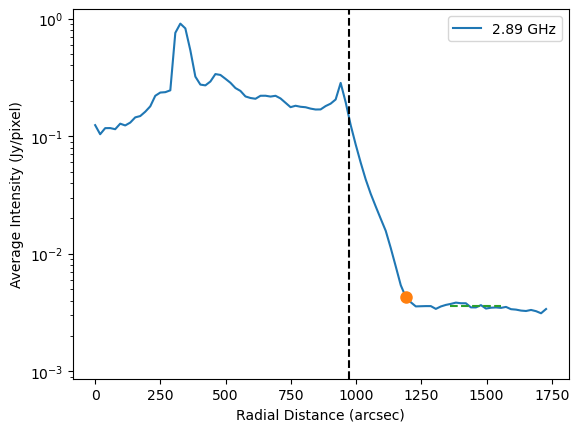

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.02.89GHz.I.masked.fits (RADCUT=1190.40 arcsec)


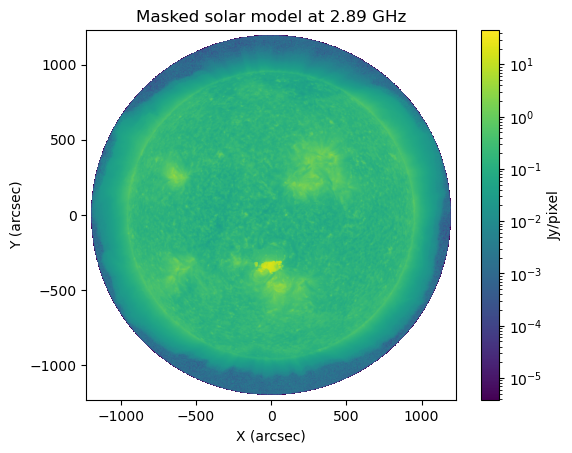

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0011 Jy/pixel at 3.21 GHz
Background level at 3.21 GHz: 0.0045 Jy/pixel


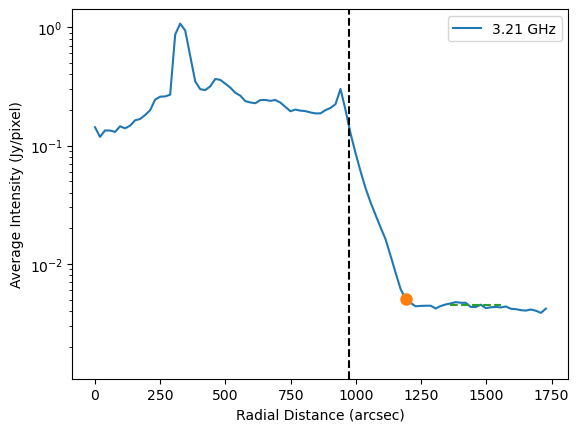

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.03.21GHz.I.masked.fits (RADCUT=1190.40 arcsec)


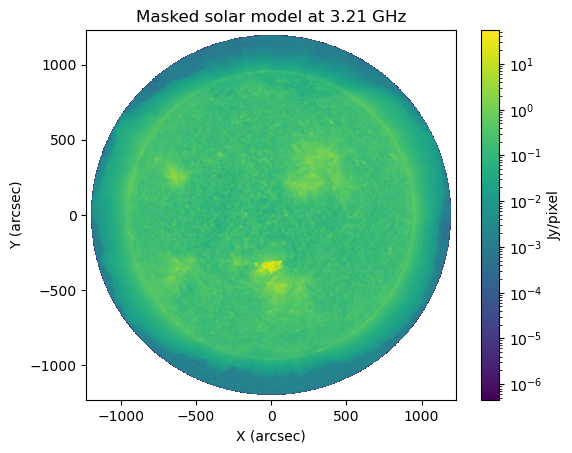

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0013 Jy/pixel at 3.54 GHz
Background level at 3.54 GHz: 0.0054 Jy/pixel


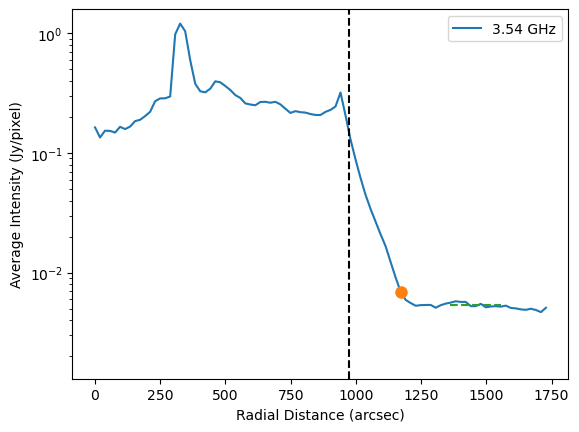

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.03.54GHz.I.masked.fits (RADCUT=1171.20 arcsec)


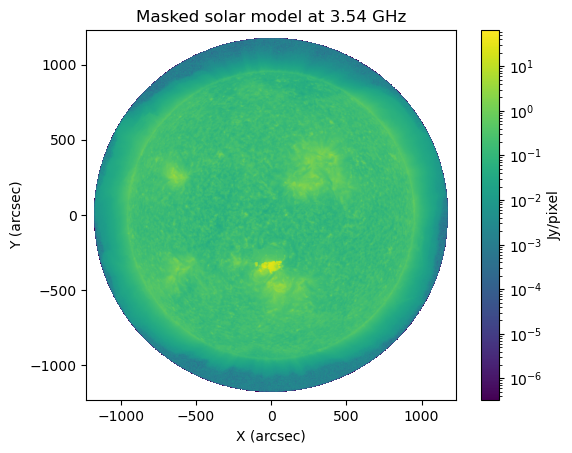

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0016 Jy/pixel at 3.86 GHz
Background level at 3.86 GHz: 0.0065 Jy/pixel


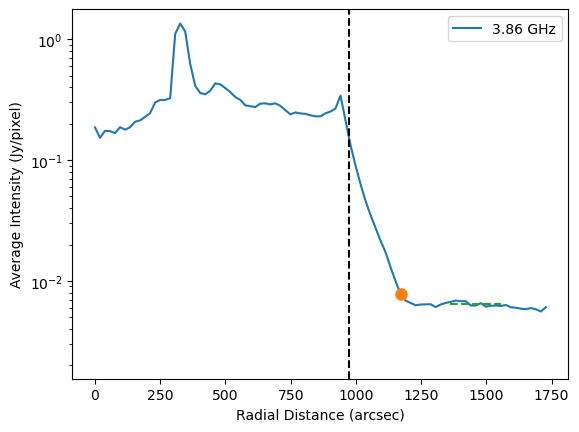

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.03.86GHz.I.masked.fits (RADCUT=1171.20 arcsec)


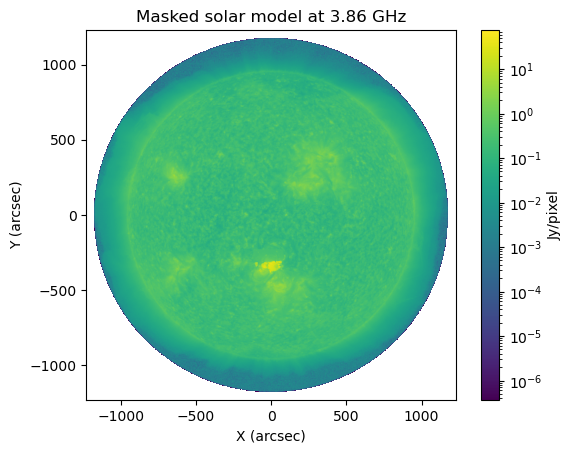

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0018 Jy/pixel at 4.19 GHz
Background level at 4.19 GHz: 0.0076 Jy/pixel


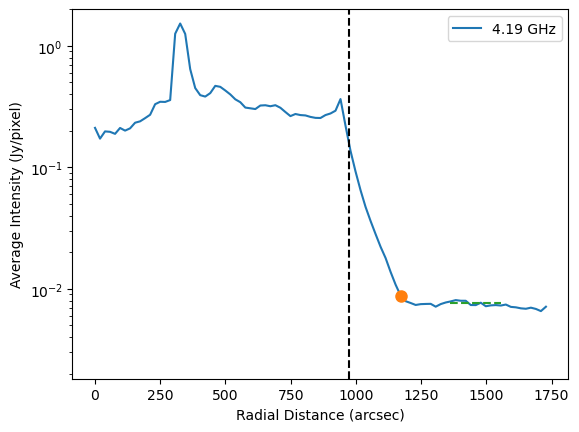

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.04.19GHz.I.masked.fits (RADCUT=1171.20 arcsec)


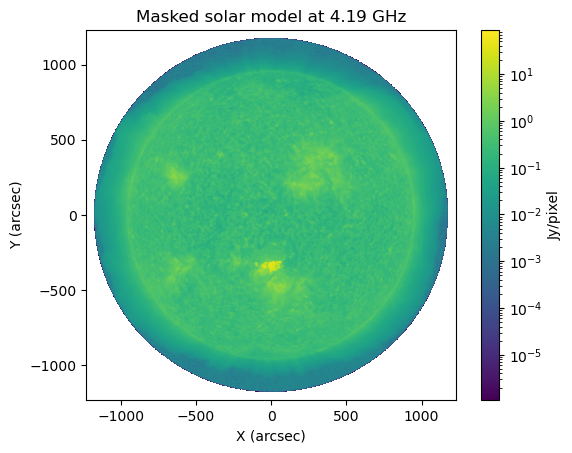

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0021 Jy/pixel at 4.51 GHz
Background level at 4.51 GHz: 0.0088 Jy/pixel


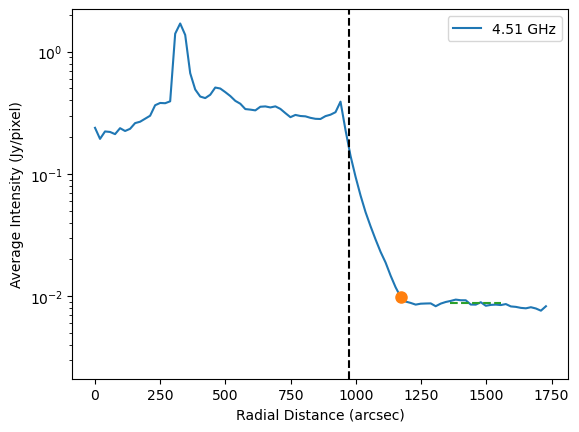

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.04.51GHz.I.masked.fits (RADCUT=1171.20 arcsec)


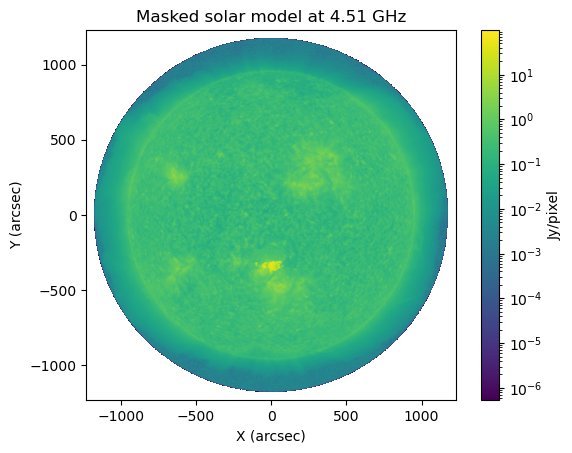

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0024 Jy/pixel at 4.84 GHz
Background level at 4.84 GHz: 0.0101 Jy/pixel


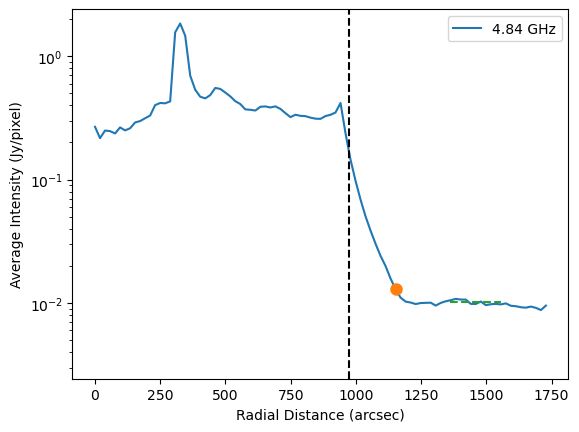

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.04.84GHz.I.masked.fits (RADCUT=1152.00 arcsec)


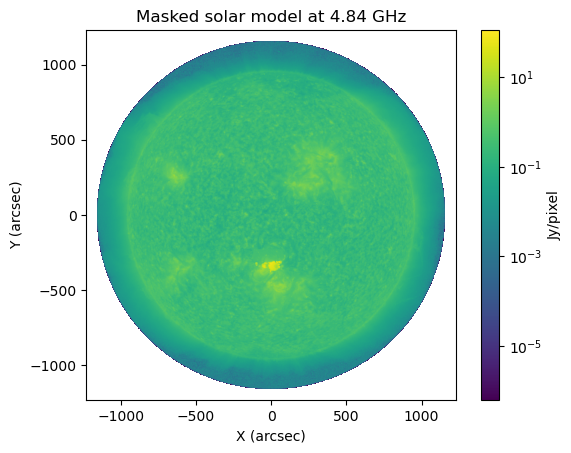

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0028 Jy/pixel at 5.16 GHz
Background level at 5.16 GHz: 0.0115 Jy/pixel


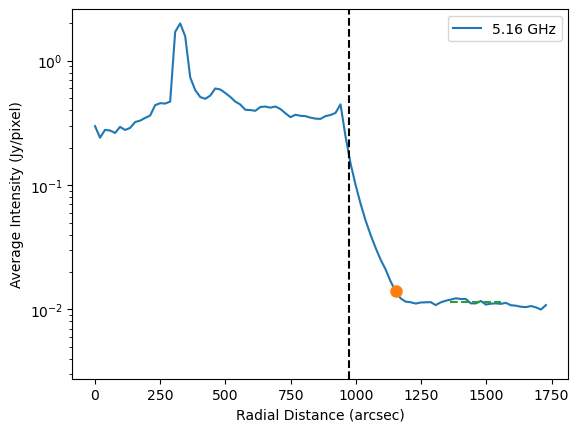

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.05.16GHz.I.masked.fits (RADCUT=1152.00 arcsec)


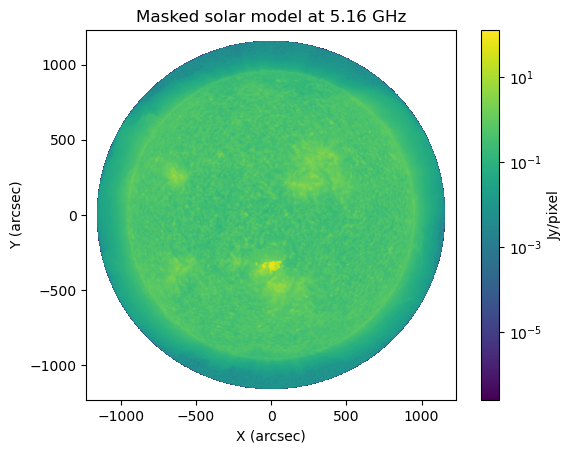

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0031 Jy/pixel at 5.49 GHz
Background level at 5.49 GHz: 0.0130 Jy/pixel


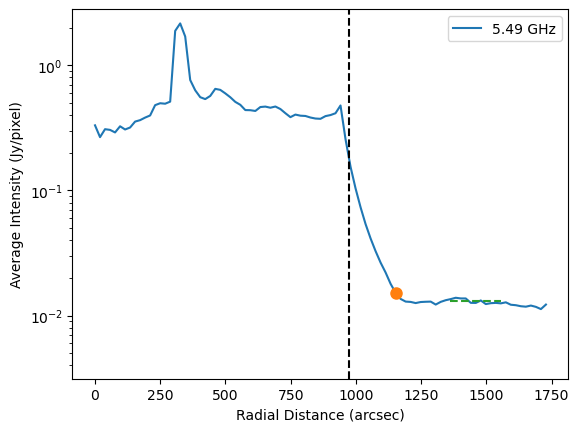

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.05.49GHz.I.masked.fits (RADCUT=1152.00 arcsec)


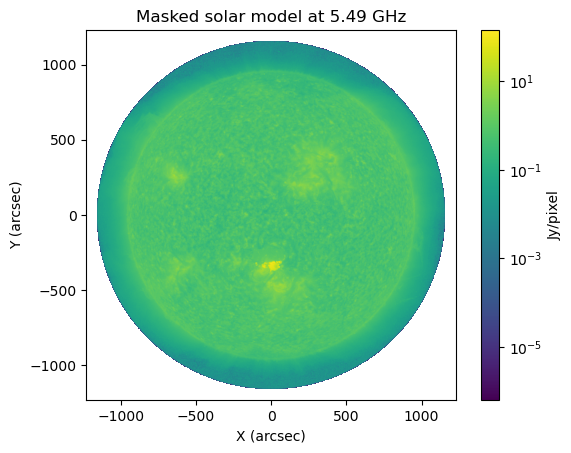

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0035 Jy/pixel at 5.81 GHz
Background level at 5.81 GHz: 0.0146 Jy/pixel


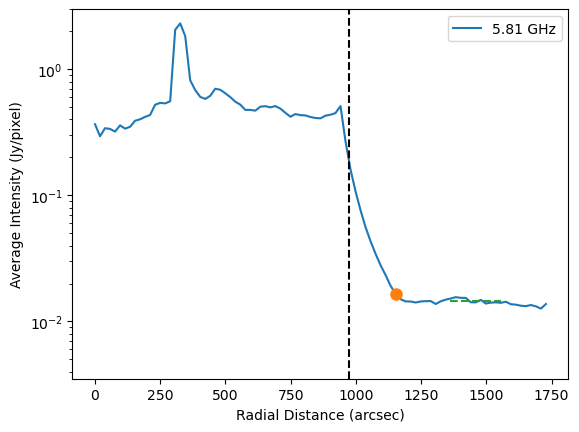

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.05.81GHz.I.masked.fits (RADCUT=1152.00 arcsec)


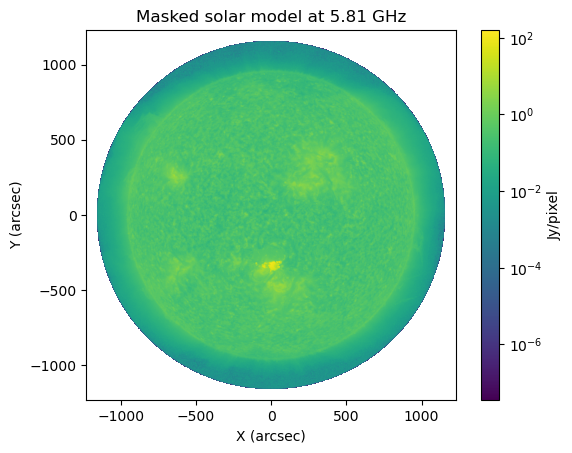

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0039 Jy/pixel at 6.14 GHz
Background level at 6.14 GHz: 0.0163 Jy/pixel


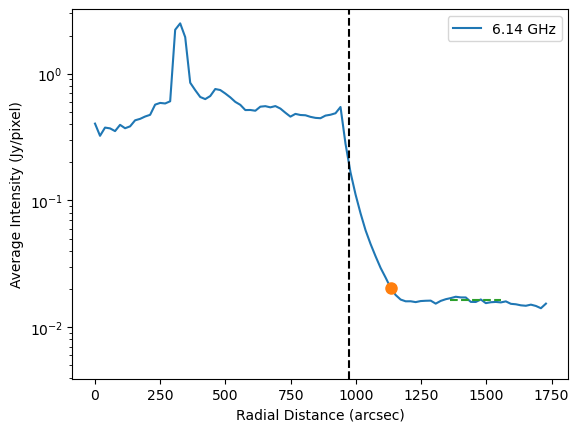

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.06.14GHz.I.masked.fits (RADCUT=1132.80 arcsec)


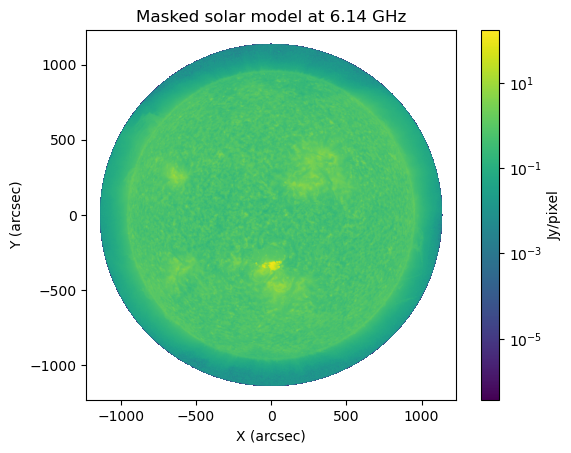

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0043 Jy/pixel at 6.46 GHz
Background level at 6.46 GHz: 0.0181 Jy/pixel


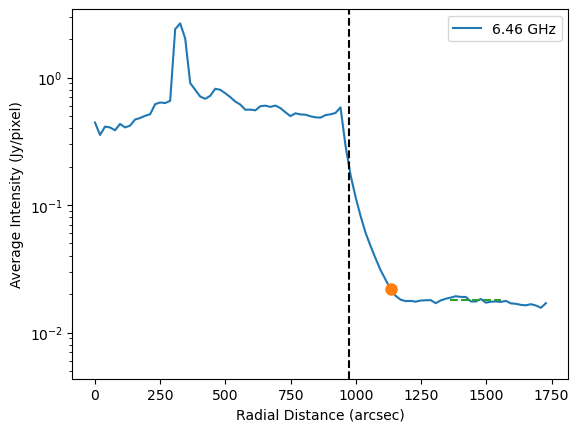

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.06.46GHz.I.masked.fits (RADCUT=1132.80 arcsec)


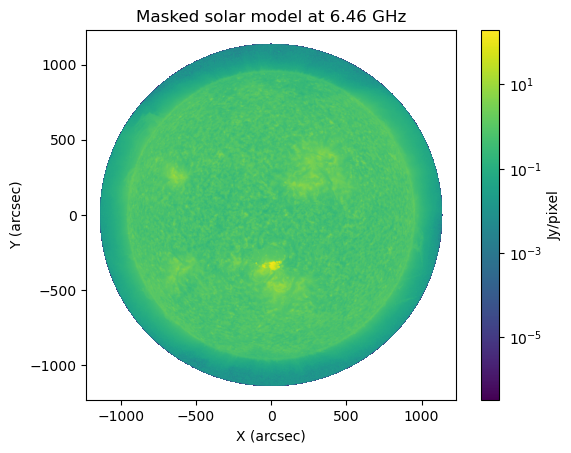

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0048 Jy/pixel at 6.79 GHz
Background level at 6.79 GHz: 0.0200 Jy/pixel


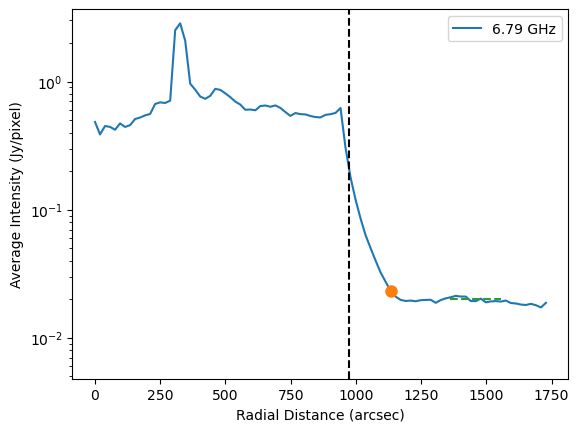

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.06.79GHz.I.masked.fits (RADCUT=1132.80 arcsec)


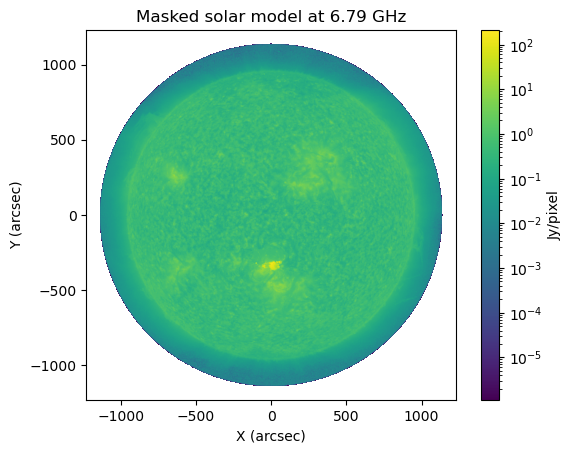

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0053 Jy/pixel at 7.11 GHz
Background level at 7.11 GHz: 0.0219 Jy/pixel


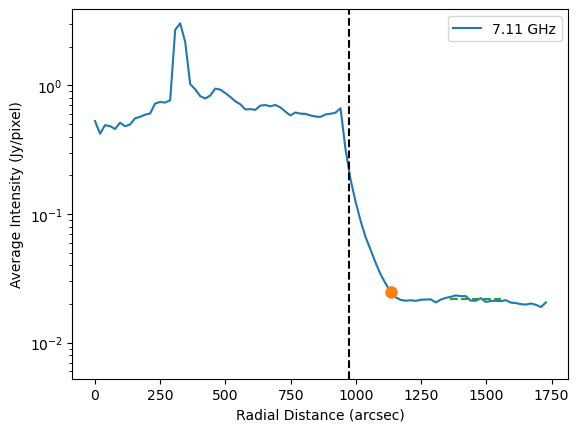

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.07.11GHz.I.masked.fits (RADCUT=1132.80 arcsec)


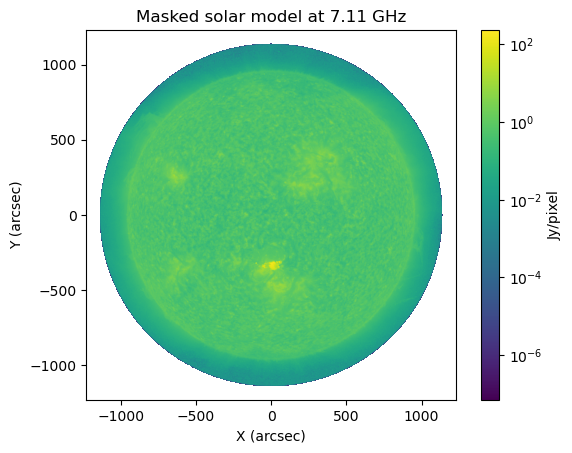

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0058 Jy/pixel at 7.44 GHz
Background level at 7.44 GHz: 0.0240 Jy/pixel


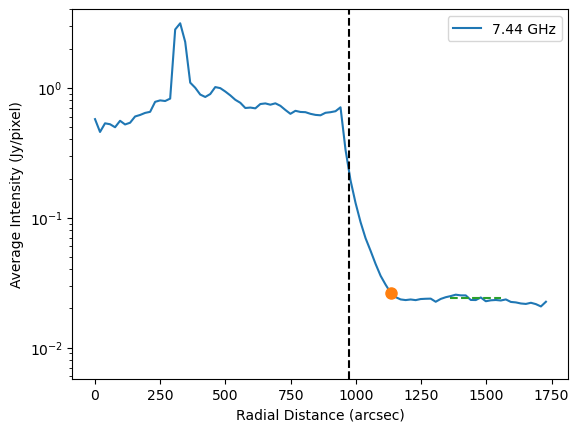

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.07.44GHz.I.masked.fits (RADCUT=1132.80 arcsec)


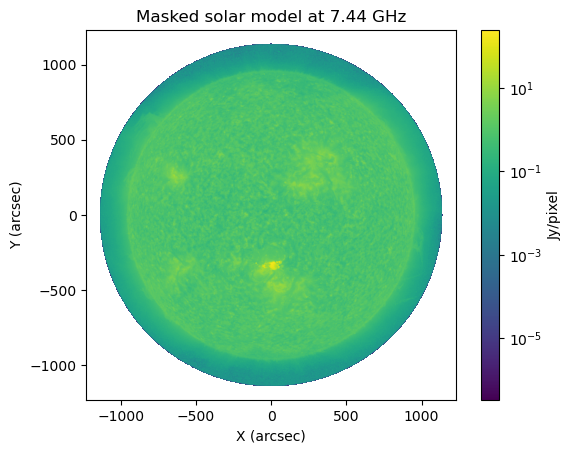

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0063 Jy/pixel at 7.76 GHz
Background level at 7.76 GHz: 0.0261 Jy/pixel


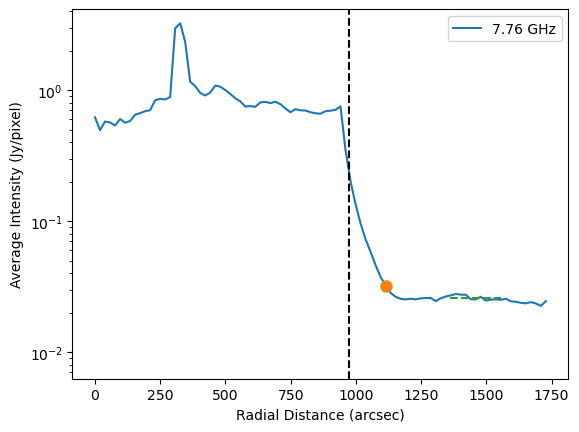

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.07.76GHz.I.masked.fits (RADCUT=1113.60 arcsec)


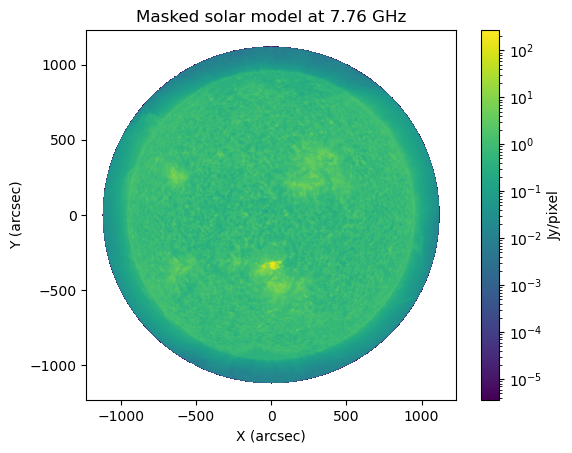

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0068 Jy/pixel at 8.09 GHz
Background level at 8.09 GHz: 0.0283 Jy/pixel


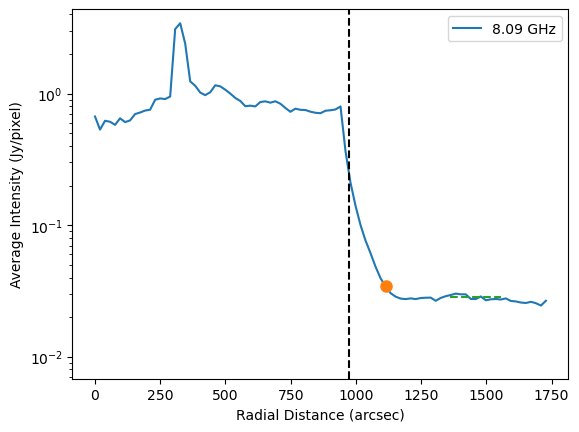

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.08.09GHz.I.masked.fits (RADCUT=1113.60 arcsec)


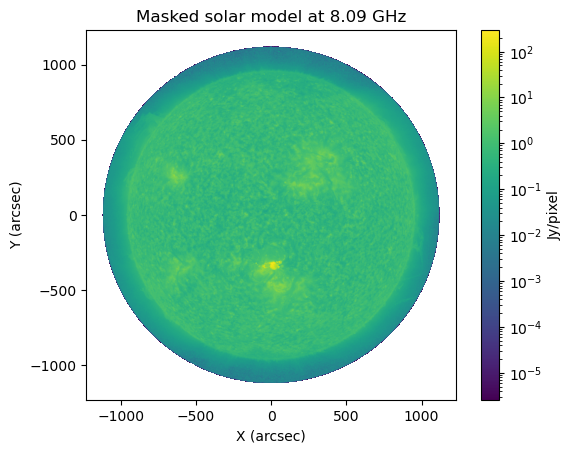

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0074 Jy/pixel at 8.41 GHz
Background level at 8.41 GHz: 0.0307 Jy/pixel


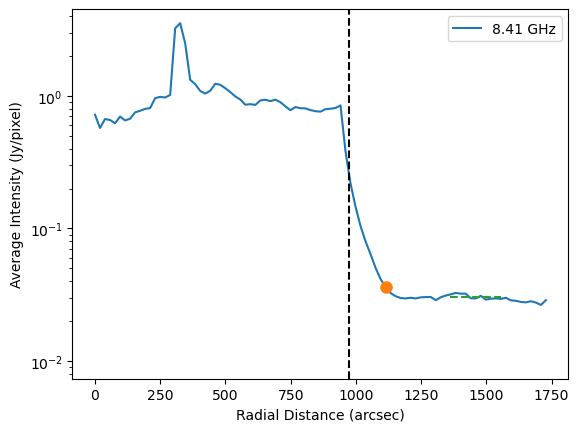

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.08.41GHz.I.masked.fits (RADCUT=1113.60 arcsec)


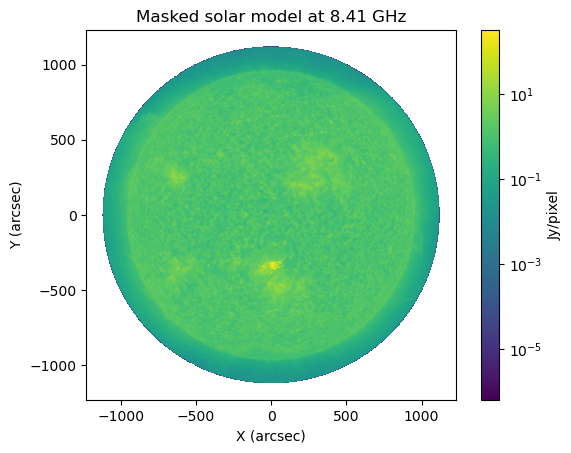

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0079 Jy/pixel at 8.74 GHz
Background level at 8.74 GHz: 0.0331 Jy/pixel


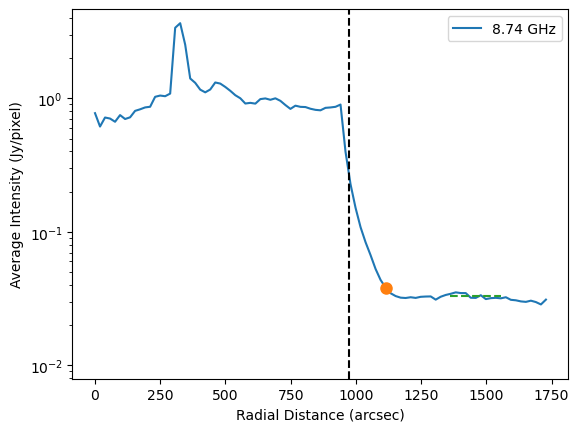

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.08.74GHz.I.masked.fits (RADCUT=1113.60 arcsec)


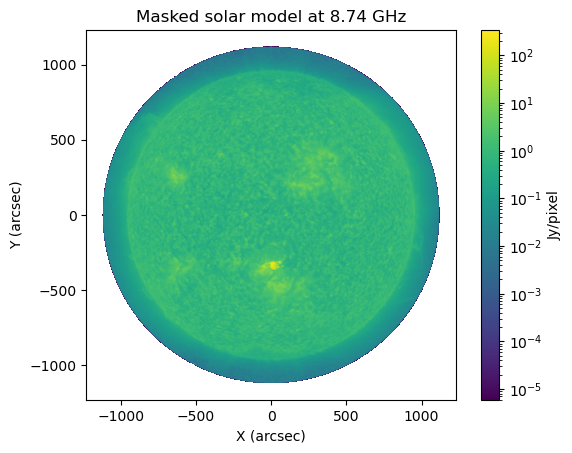

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0085 Jy/pixel at 9.06 GHz
Background level at 9.06 GHz: 0.0356 Jy/pixel


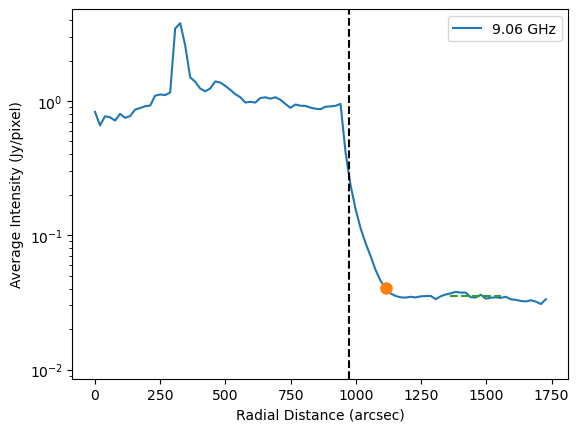

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.09.06GHz.I.masked.fits (RADCUT=1113.60 arcsec)


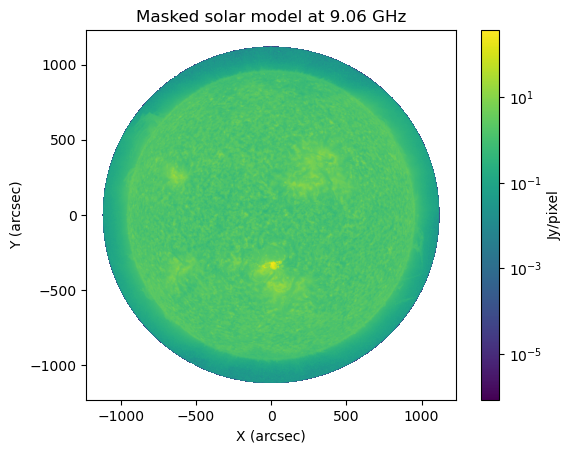

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0092 Jy/pixel at 9.39 GHz
Background level at 9.39 GHz: 0.0382 Jy/pixel


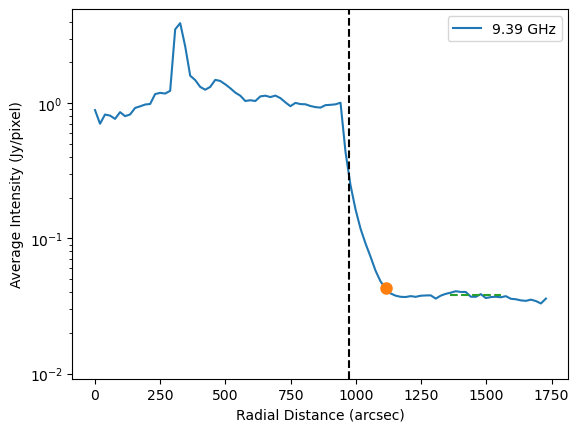

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.09.39GHz.I.masked.fits (RADCUT=1113.60 arcsec)


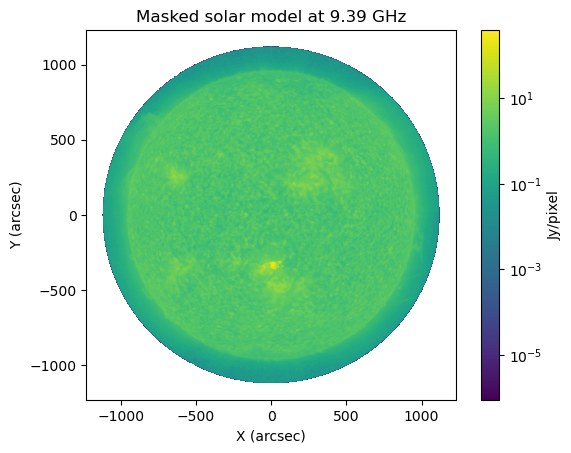

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0098 Jy/pixel at 9.71 GHz
Background level at 9.71 GHz: 0.0409 Jy/pixel


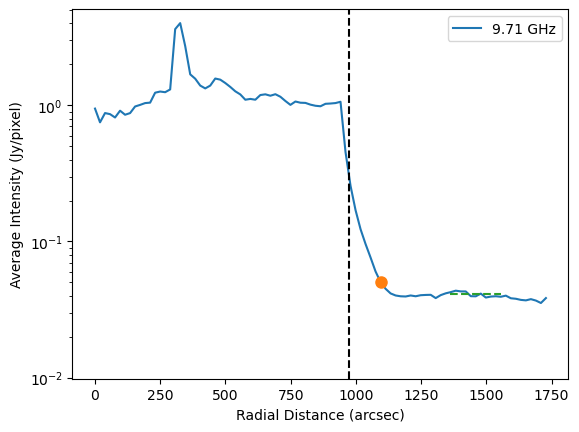

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.09.71GHz.I.masked.fits (RADCUT=1094.40 arcsec)


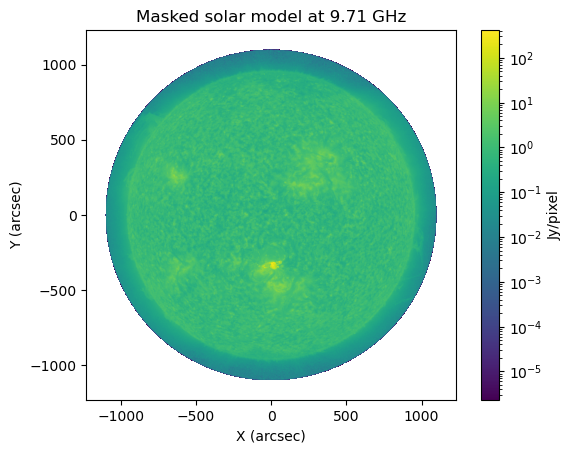

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0105 Jy/pixel at 10.04 GHz
Background level at 10.04 GHz: 0.0436 Jy/pixel


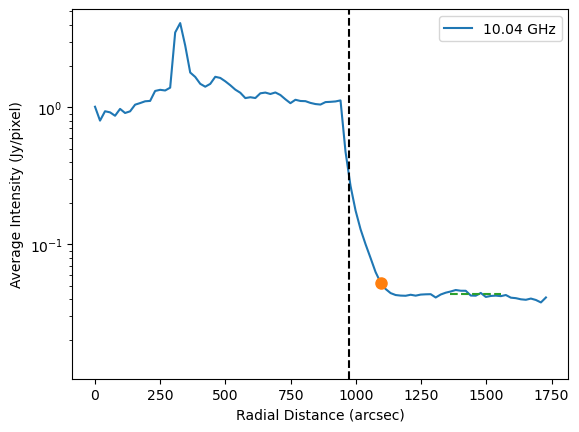

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.10.04GHz.I.masked.fits (RADCUT=1094.40 arcsec)


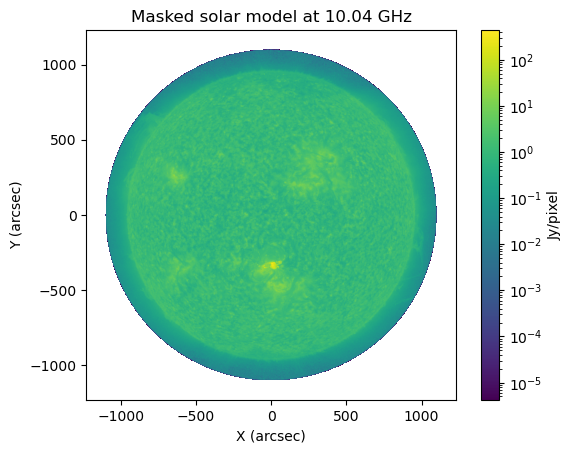

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0112 Jy/pixel at 10.36 GHz
Background level at 10.36 GHz: 0.0465 Jy/pixel


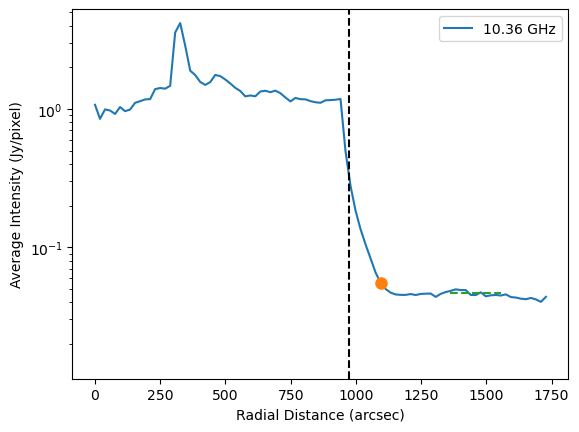

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.10.36GHz.I.masked.fits (RADCUT=1094.40 arcsec)


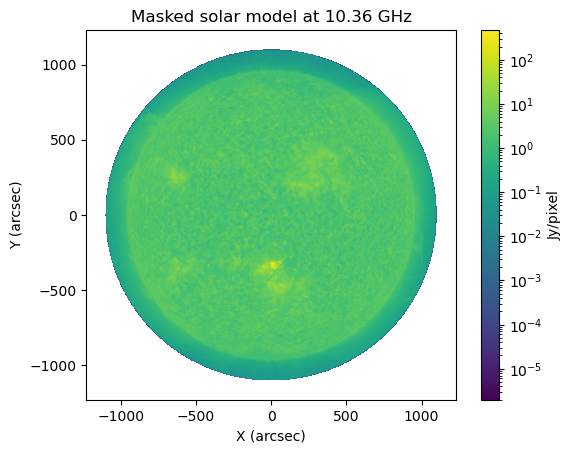

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0119 Jy/pixel at 10.69 GHz
Background level at 10.69 GHz: 0.0495 Jy/pixel


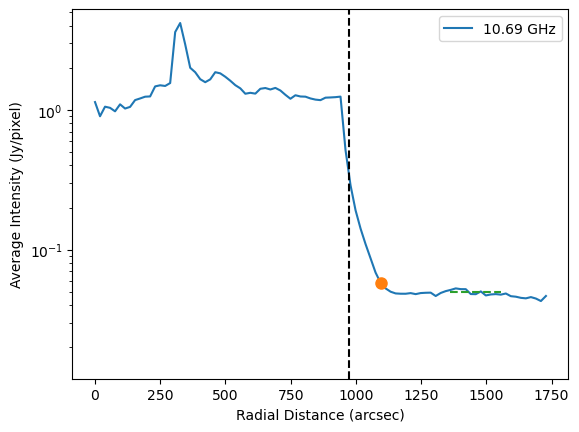

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.10.69GHz.I.masked.fits (RADCUT=1094.40 arcsec)


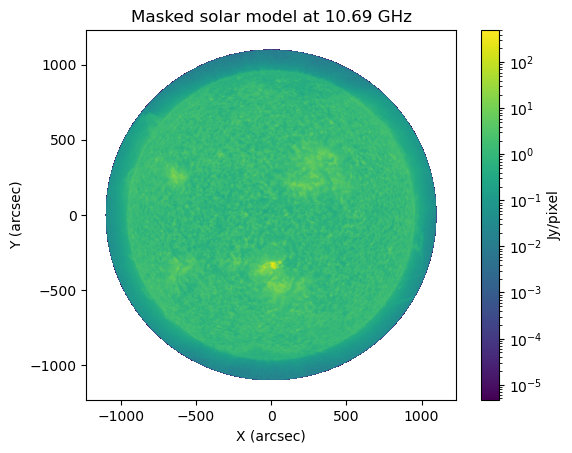

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0126 Jy/pixel at 11.01 GHz
Background level at 11.01 GHz: 0.0525 Jy/pixel


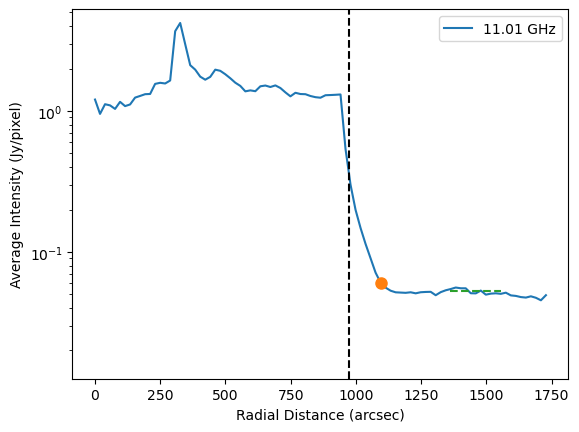

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.11.01GHz.I.masked.fits (RADCUT=1094.40 arcsec)


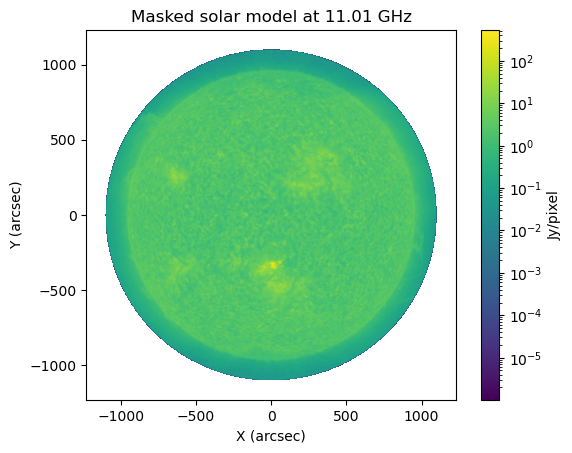

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0134 Jy/pixel at 11.34 GHz
Background level at 11.34 GHz: 0.0557 Jy/pixel


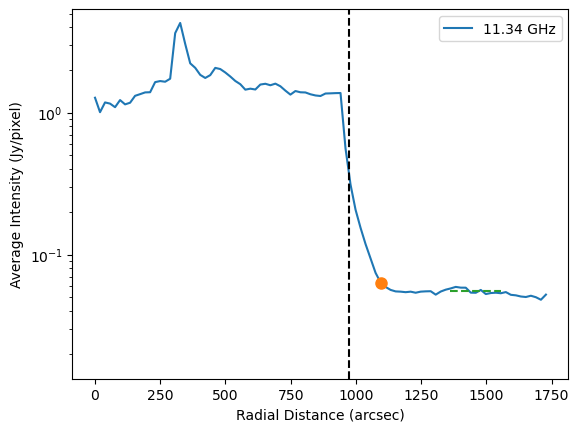

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.11.34GHz.I.masked.fits (RADCUT=1094.40 arcsec)


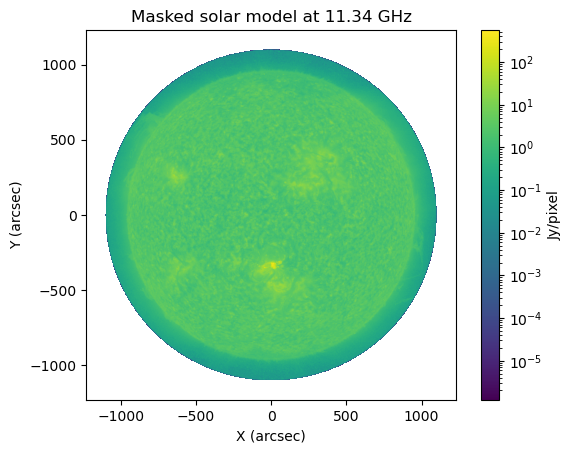

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0141 Jy/pixel at 11.66 GHz
Background level at 11.66 GHz: 0.0589 Jy/pixel


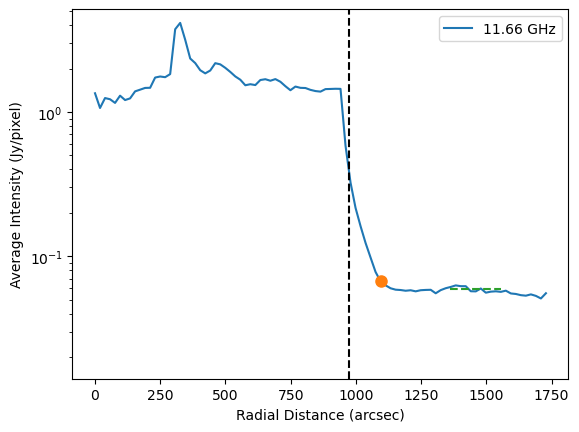

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.11.66GHz.I.masked.fits (RADCUT=1094.40 arcsec)


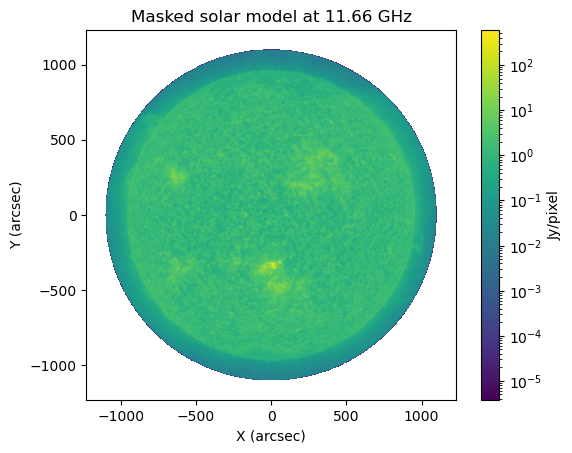

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0149 Jy/pixel at 11.99 GHz
Background level at 11.99 GHz: 0.0622 Jy/pixel


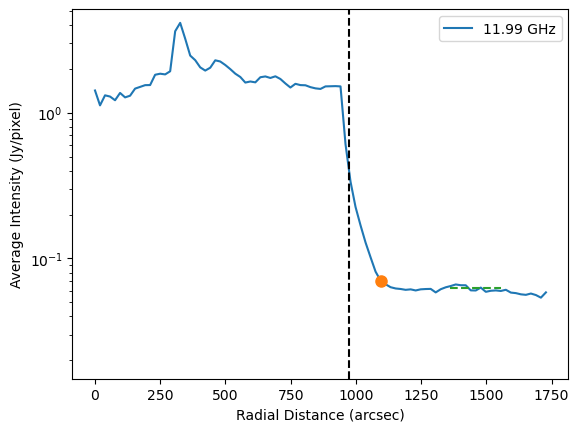

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.11.99GHz.I.masked.fits (RADCUT=1094.40 arcsec)


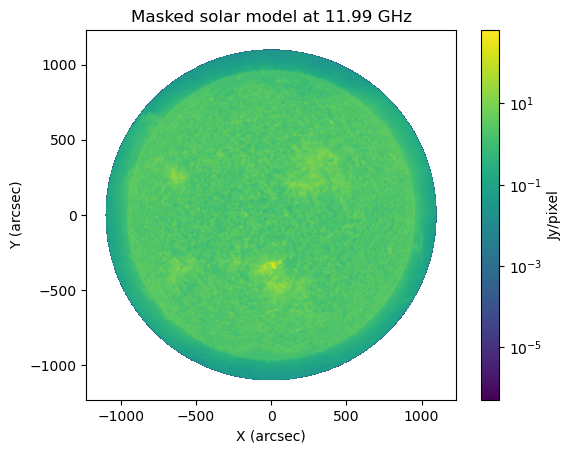

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0158 Jy/pixel at 12.31 GHz
Background level at 12.31 GHz: 0.0657 Jy/pixel


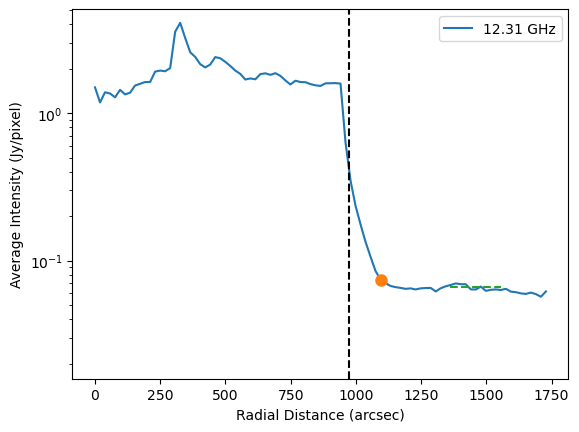

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.12.31GHz.I.masked.fits (RADCUT=1094.40 arcsec)


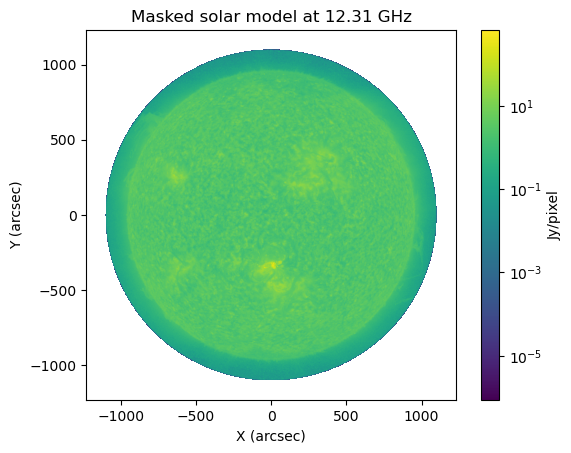

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0166 Jy/pixel at 12.64 GHz
Background level at 12.64 GHz: 0.0692 Jy/pixel


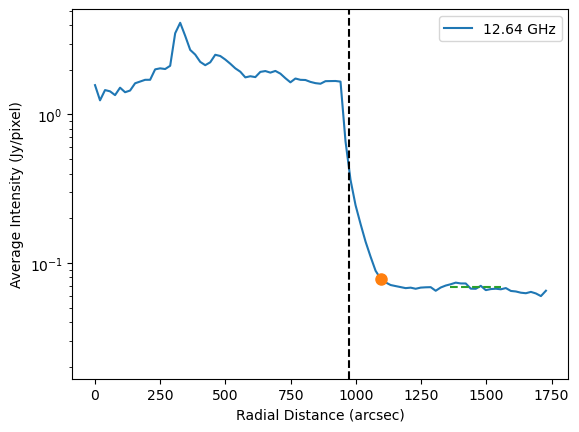

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.12.64GHz.I.masked.fits (RADCUT=1094.40 arcsec)


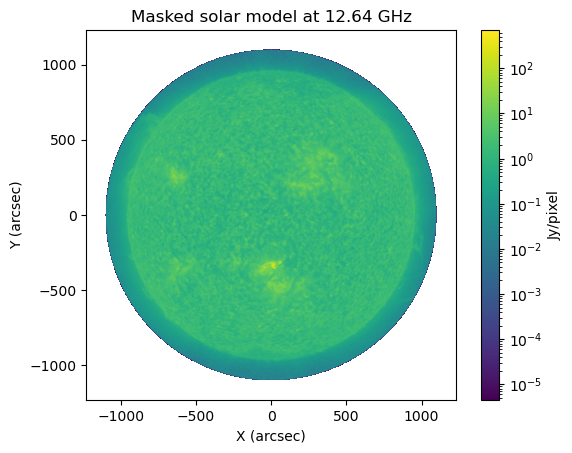

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0175 Jy/pixel at 12.96 GHz
Background level at 12.96 GHz: 0.0728 Jy/pixel


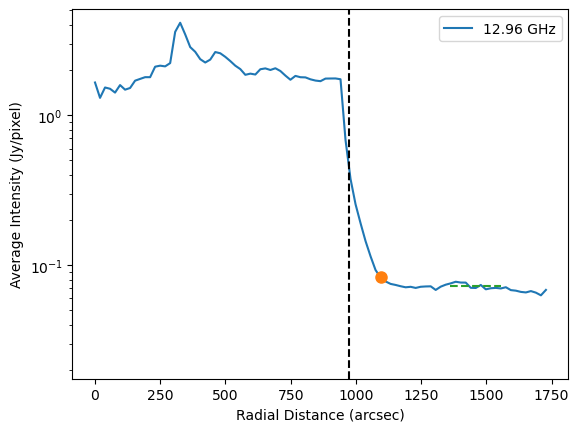

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.12.96GHz.I.masked.fits (RADCUT=1094.40 arcsec)


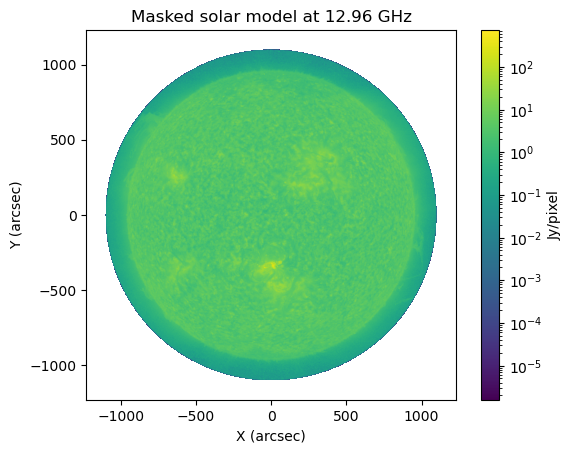

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0184 Jy/pixel at 13.29 GHz
Background level at 13.29 GHz: 0.0765 Jy/pixel


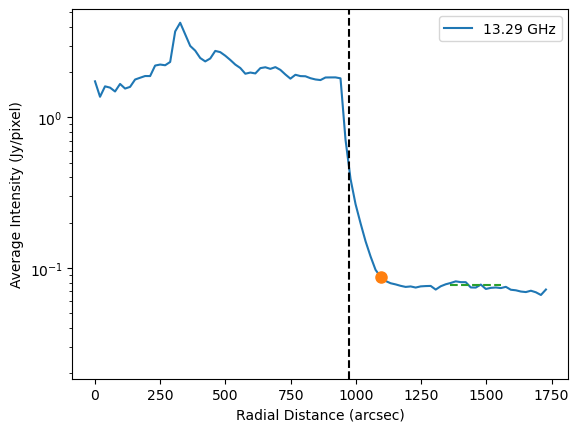

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.13.29GHz.I.masked.fits (RADCUT=1094.40 arcsec)


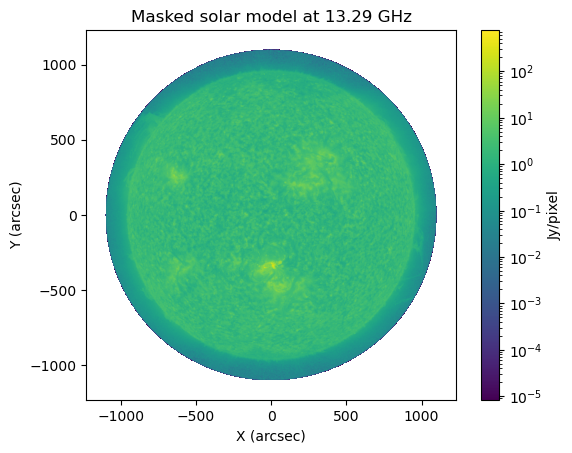

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0193 Jy/pixel at 13.61 GHz
Background level at 13.61 GHz: 0.0803 Jy/pixel


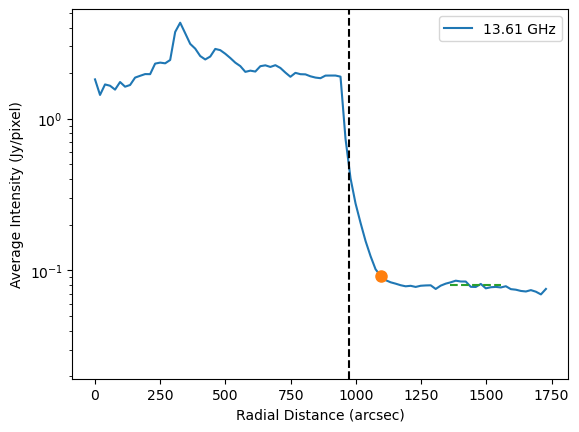

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.13.61GHz.I.masked.fits (RADCUT=1094.40 arcsec)


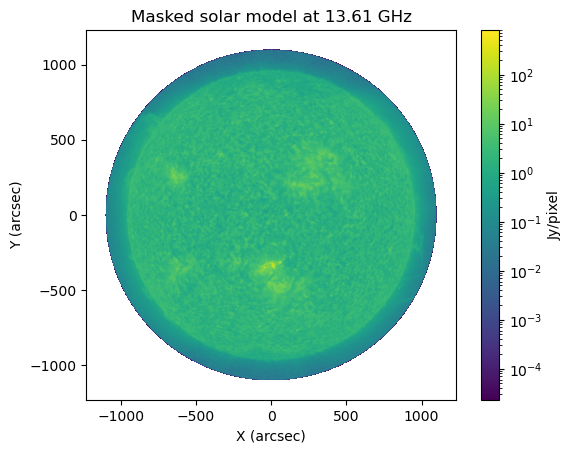

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0202 Jy/pixel at 13.94 GHz
Background level at 13.94 GHz: 0.0841 Jy/pixel


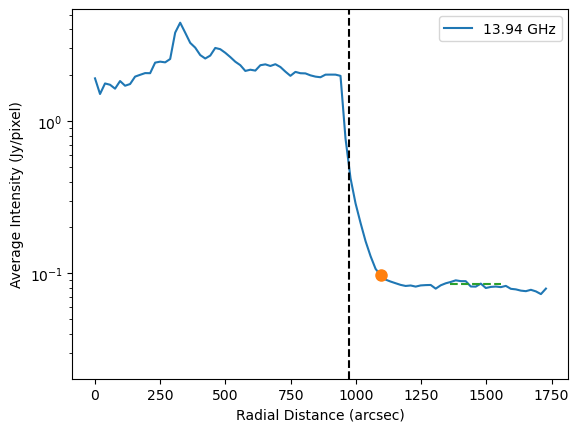

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.13.94GHz.I.masked.fits (RADCUT=1094.40 arcsec)


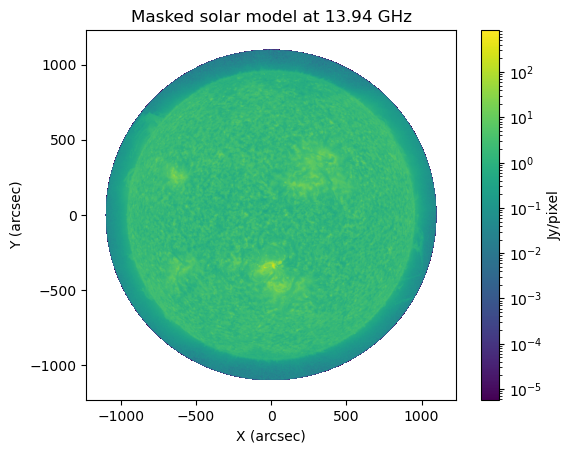

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0212 Jy/pixel at 14.26 GHz
Background level at 14.26 GHz: 0.0881 Jy/pixel


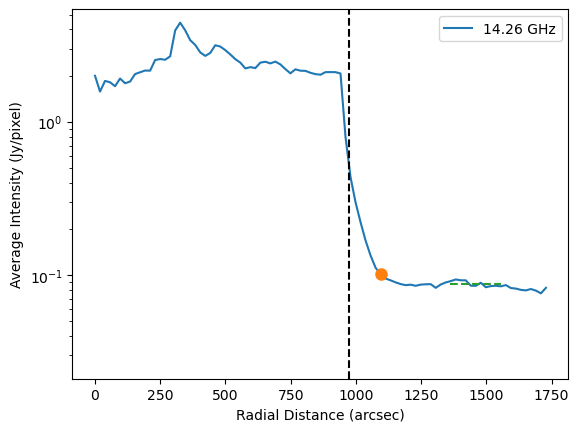

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.14.26GHz.I.masked.fits (RADCUT=1094.40 arcsec)


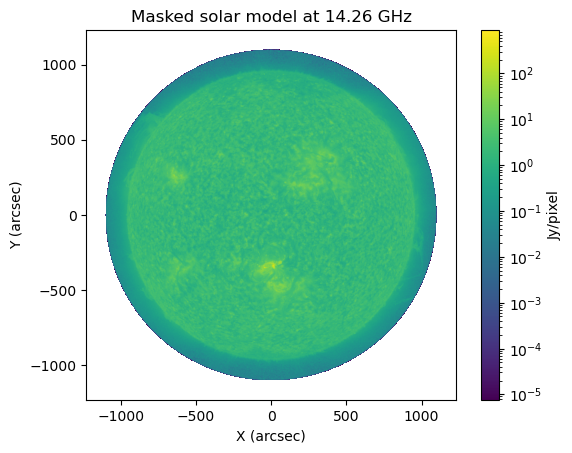

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0221 Jy/pixel at 14.59 GHz
Background level at 14.59 GHz: 0.0922 Jy/pixel


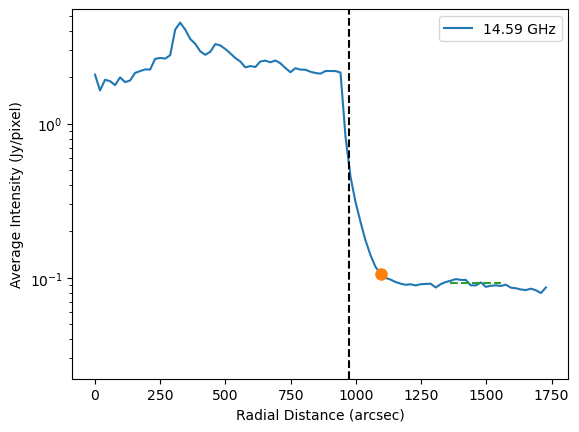

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.14.59GHz.I.masked.fits (RADCUT=1094.40 arcsec)


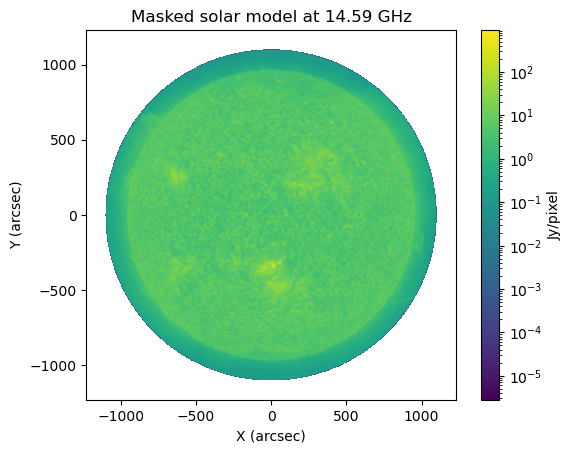

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0231 Jy/pixel at 14.91 GHz
Background level at 14.91 GHz: 0.0963 Jy/pixel


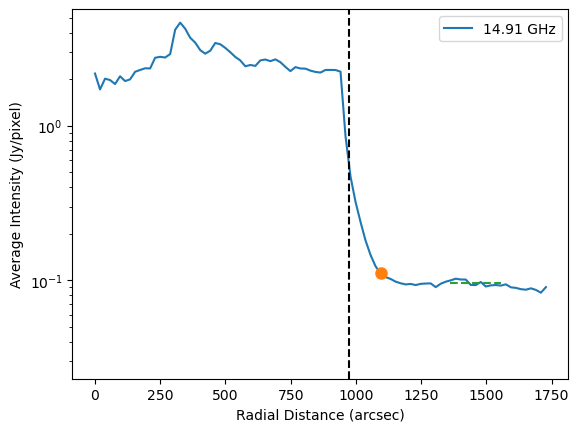

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.14.91GHz.I.masked.fits (RADCUT=1094.40 arcsec)


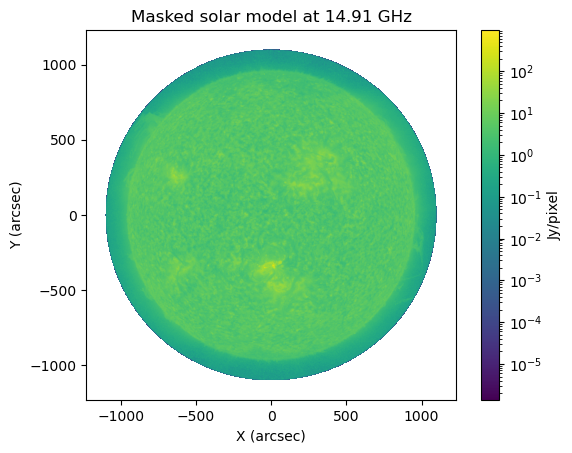

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0241 Jy/pixel at 15.24 GHz
Background level at 15.24 GHz: 0.1006 Jy/pixel


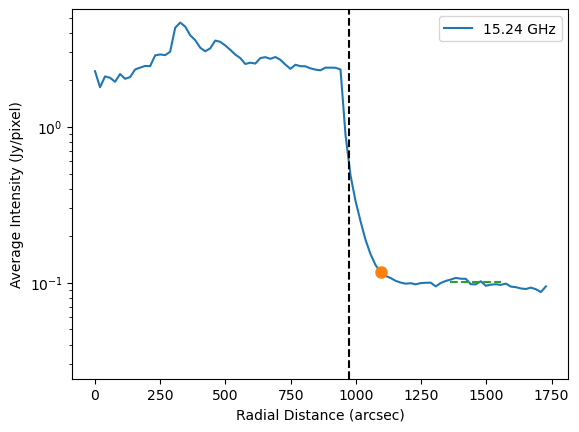

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.15.24GHz.I.masked.fits (RADCUT=1094.40 arcsec)


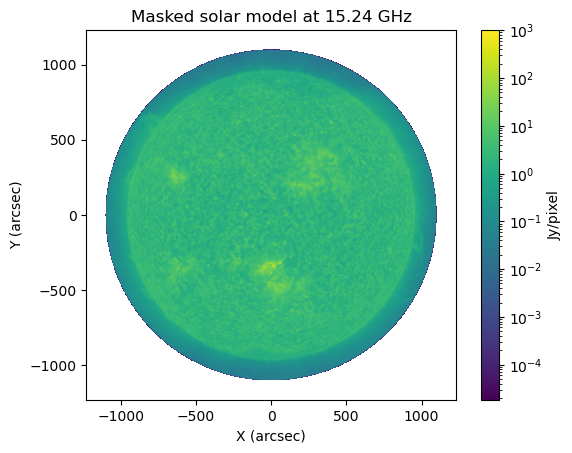

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0252 Jy/pixel at 15.56 GHz
Background level at 15.56 GHz: 0.1049 Jy/pixel


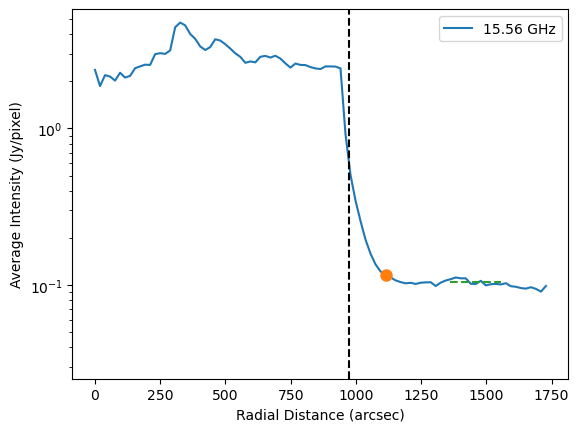

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.15.56GHz.I.masked.fits (RADCUT=1113.60 arcsec)


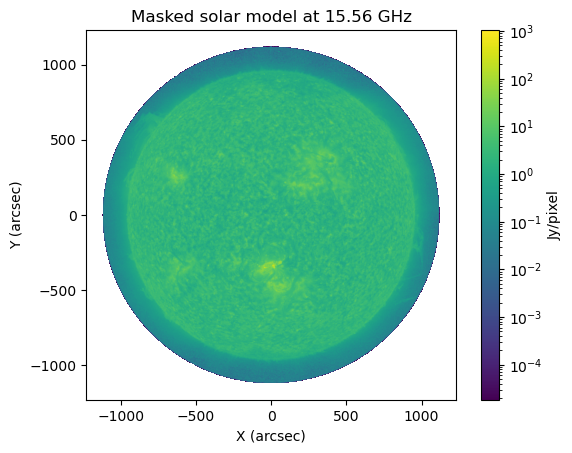

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0263 Jy/pixel at 15.89 GHz
Background level at 15.89 GHz: 0.1093 Jy/pixel


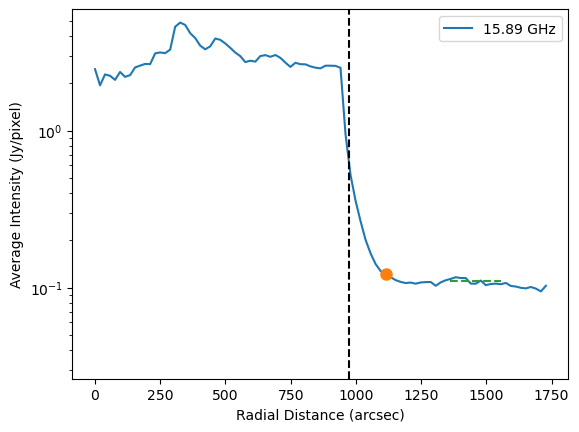

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.15.89GHz.I.masked.fits (RADCUT=1113.60 arcsec)


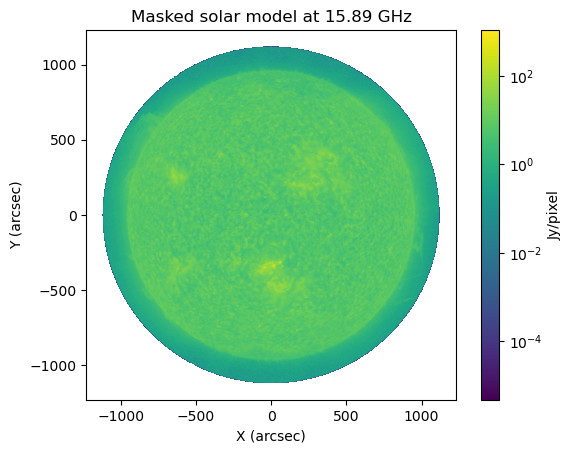

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0273 Jy/pixel at 16.21 GHz
Background level at 16.21 GHz: 0.1139 Jy/pixel


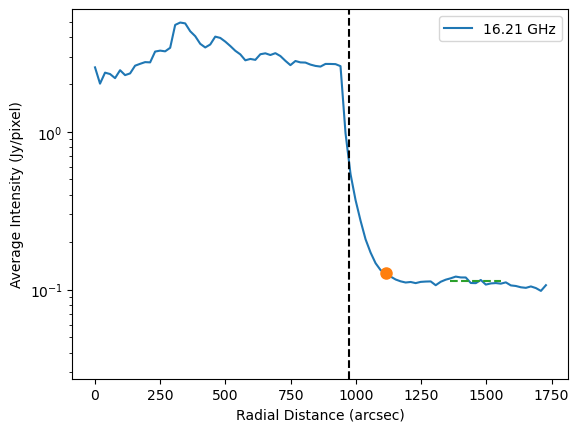

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.16.21GHz.I.masked.fits (RADCUT=1113.60 arcsec)


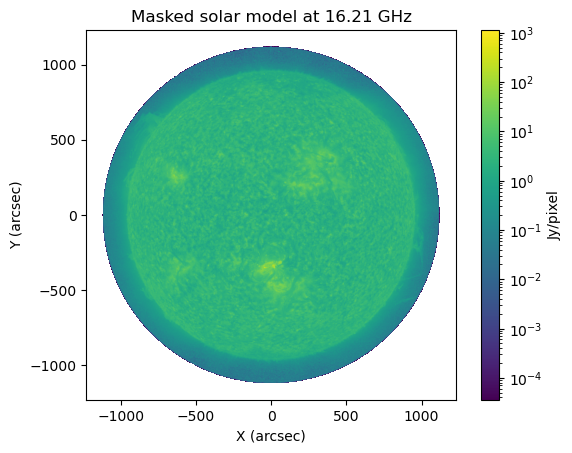

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0284 Jy/pixel at 16.54 GHz
Background level at 16.54 GHz: 0.1185 Jy/pixel


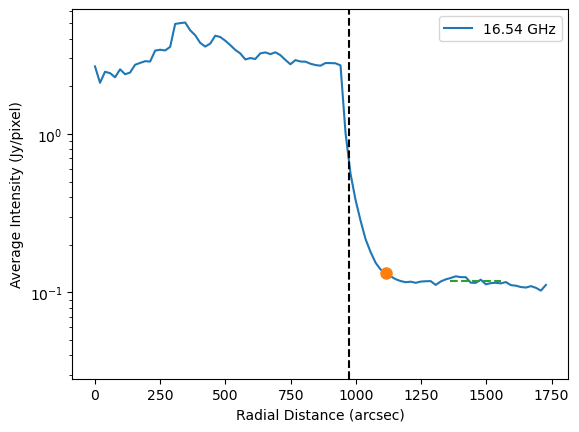

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.16.54GHz.I.masked.fits (RADCUT=1113.60 arcsec)


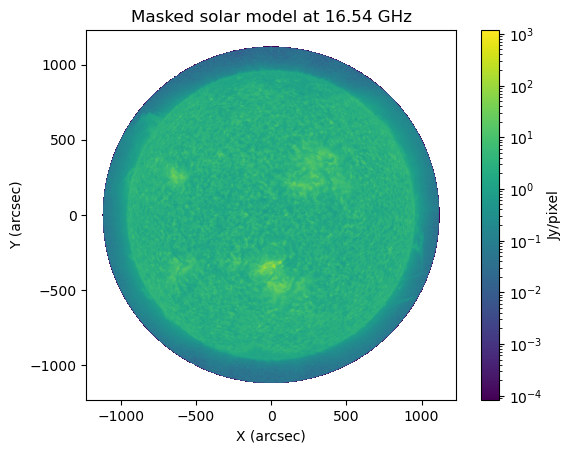

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0296 Jy/pixel at 16.86 GHz
Background level at 16.86 GHz: 0.1232 Jy/pixel


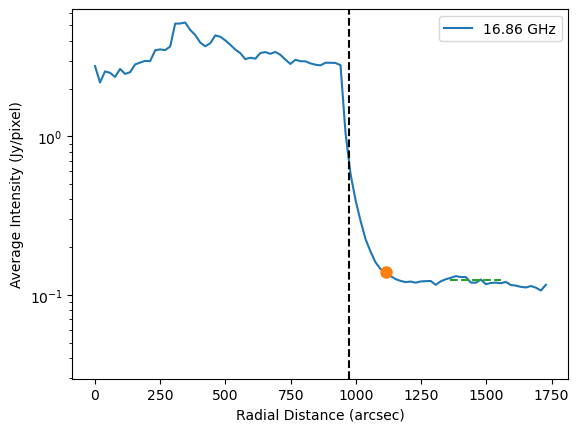

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.16.86GHz.I.masked.fits (RADCUT=1113.60 arcsec)


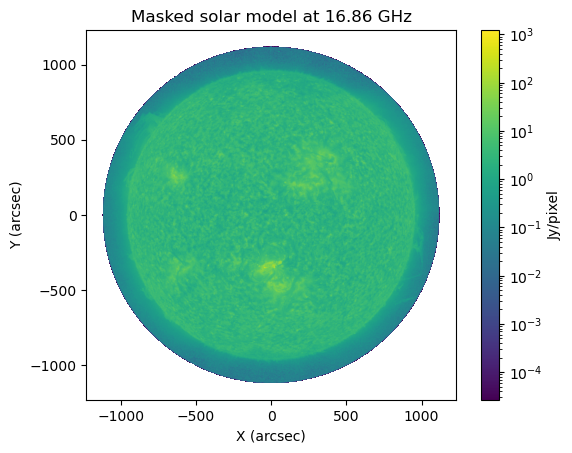

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0307 Jy/pixel at 17.19 GHz
Background level at 17.19 GHz: 0.1280 Jy/pixel


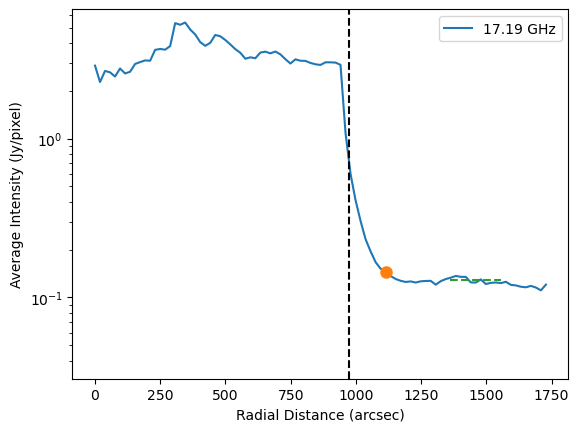

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.17.19GHz.I.masked.fits (RADCUT=1113.60 arcsec)


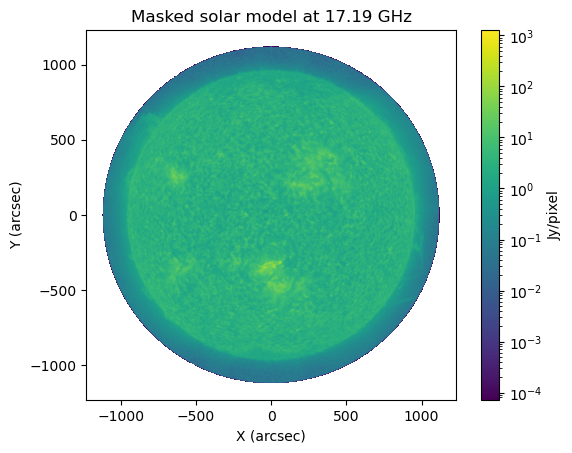

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0319 Jy/pixel at 17.51 GHz
Background level at 17.51 GHz: 0.1328 Jy/pixel


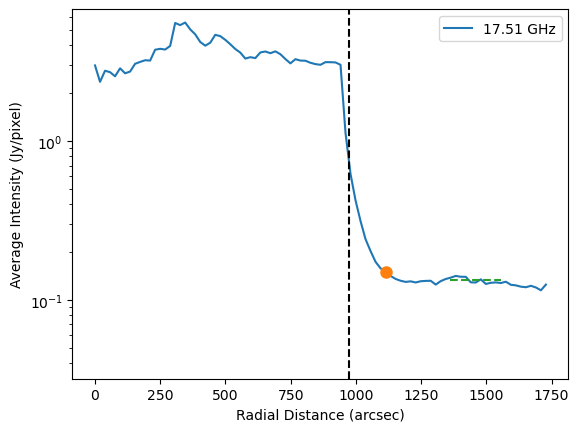

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.17.51GHz.I.masked.fits (RADCUT=1113.60 arcsec)


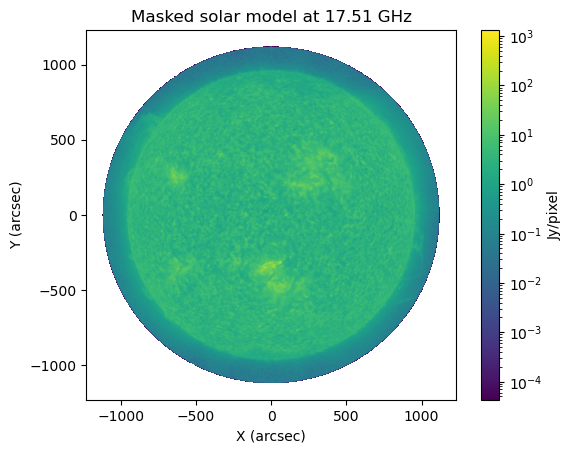

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0331 Jy/pixel at 17.84 GHz
Background level at 17.84 GHz: 0.1378 Jy/pixel


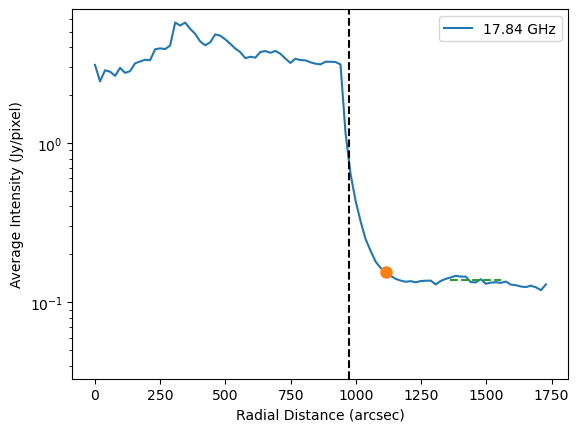

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.17.84GHz.I.masked.fits (RADCUT=1113.60 arcsec)


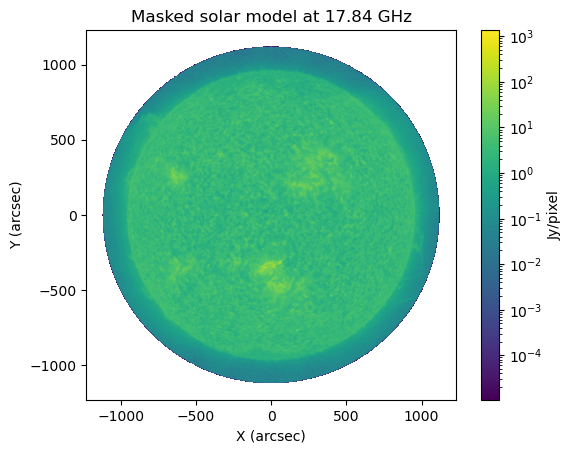

Pixel scale: 1.20 x 1.20 arcsec
Minimum flux threshold: 0.0002 Jy/pixel at 1.26 GHz
Background level at 1.26 GHz: 0.0007 Jy/pixel


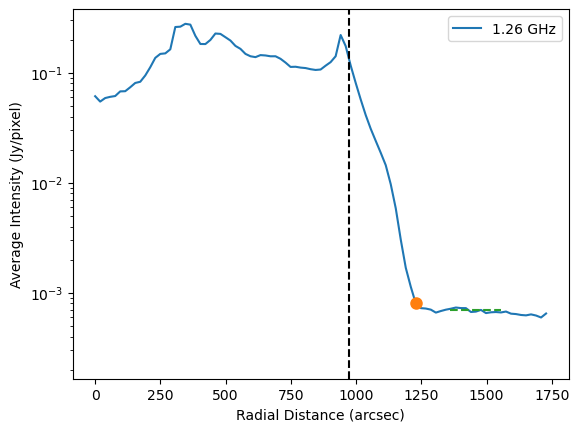

Masked solar model written to ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.allf.I.masked.fits (RADCUT=1228.80 arcsec)


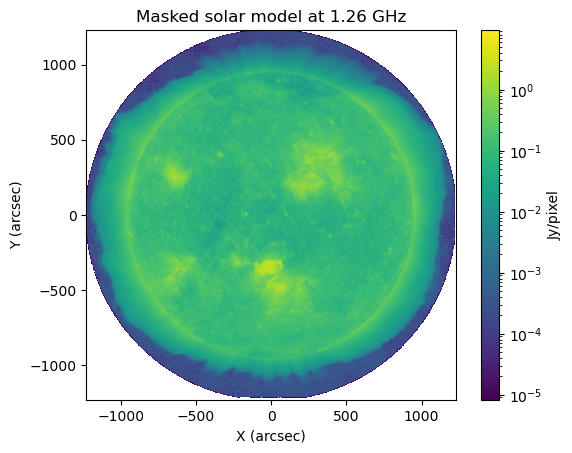

In [45]:
reload(fss)
import glob
radius_cutoffs = []
solar_models = glob.glob(f'{model_dir}/{model_prefix}*.I.fits')
solar_models.sort()
for solar_model in solar_models:
    radius_list, mean_intensity_profile, background_level, radius_cutoff = fss.calc_model_radial_profile(solar_model, dr=20, tb_min=100., bkg_radius_range=[1.4, 1.6], snr_min=1.1, apply_mask=True)
    radius_cutoffs.append(radius_cutoff)

## Simulate visibility and do imaging

Using model: ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.01.59GHz.I.masked.fits
Total flux within primary beam used to calcuate the antenna temperature: 38.1 sfu
Tant: 146K
38.0638875
Calculate antenna temperature from total flux 38.0638875 sfu incident on the dish
Total noise temperature (K): 4.462e+02 K
Estimated SEFD: 1.249e+06 Jy
Estimated natural weighting point source sensitivity sigma_na: 1.508e+00 Jy/beam
Estimated uniform weighting point source sensitivity sigma_un: 2.117e+00 Jy/beam
Estimated noise per baseline per channel per polarization per integration: 1.802e+02 Jy for 7140 baselines
Start plotting
Applying a mask of 1.3 solar radii to calculate rms outside of it.
Peak of fasr_fasr-a_random_spiral_hybrid_120_Active_Region_1.6GHz_20210630T18UT_dur1s_int1s_noise300K_phaerr5.7deg_amperr10pct_multiscale.image: 1.658e+06 K
rms of fasr_fasr-a_random_spiral_hybrid_120_Active_Region_1.6GHz_20210630T18UT_dur1s_int1s_noise300K_phaerr5.7deg_amperr

/Users/binchen/Dropbox/Projects/FASR/fasr-array-config-simul/fasr_solar_simul.py:3056: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(ctick_labels)
/Users/binchen/Dropbox/Projects/FASR/fasr-array-config-simul/fasr_solar_simul.py:3105: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(ctick_labels)


'plot_two_casa_images_with_convolution' completed at 2026-03-06 07:26:05; runtime: 0.55 seconds
FASR-A/msfiles/Active_Region/fasr_fasr-a_random_spiral_hybrid_120_Active_Region_1.6GHz_20210630T18UT_dur1s_int1s_noise300K_phaerr5.7deg_amperr10pct_multiscale.image
FASR-A/msfiles/Active_Region/AR_20210630_model_eofreq.01.59GHz.I.masked.im
Start fidelity evaluation
RMS noise in the restored image: 5.0


2026-03-06 12:26:06	WARN	imregrid::ImageRegrid::regrid	You are regridding an image whose beam is not well sampled by the pixel size.  Total flux can be lost when regridding such images, especially when the new pixel size is larger than the old pixel size. It is recommended to check the total flux of your input and output image, and if necessary rebin the input to have smaller pixels.


Fidelity Image Statistics - Peak: 235.84, Mean: 4.61, Median: 3.89, Std Dev: 5.79, SNR: 237.60


/Users/binchen/Dropbox/Projects/FASR/fasr-array-config-simul/fasr_solar_simul.py:2734: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(ctick_labels)


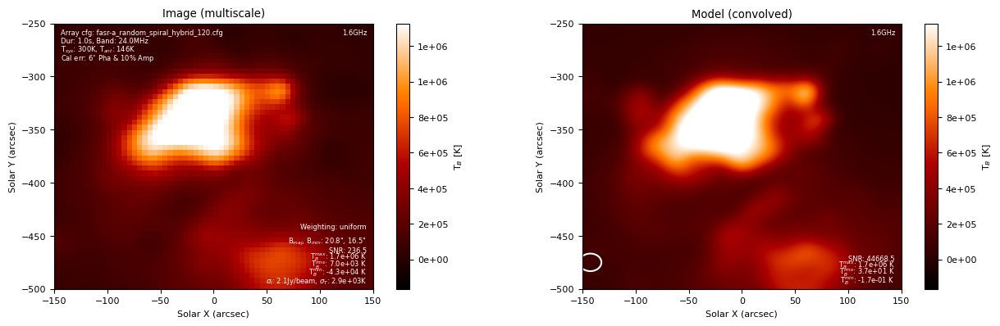

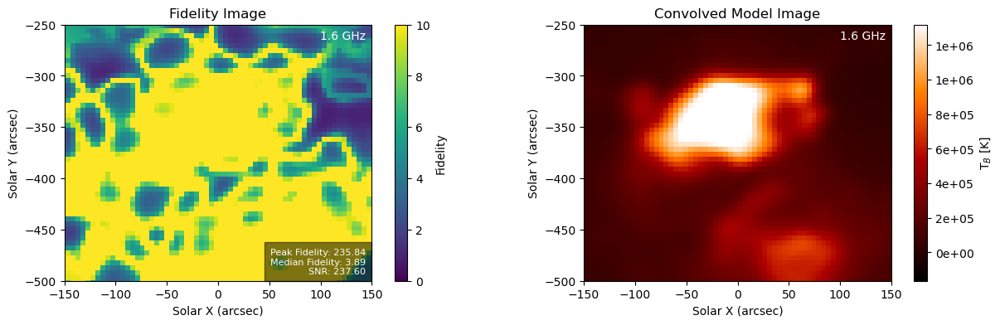

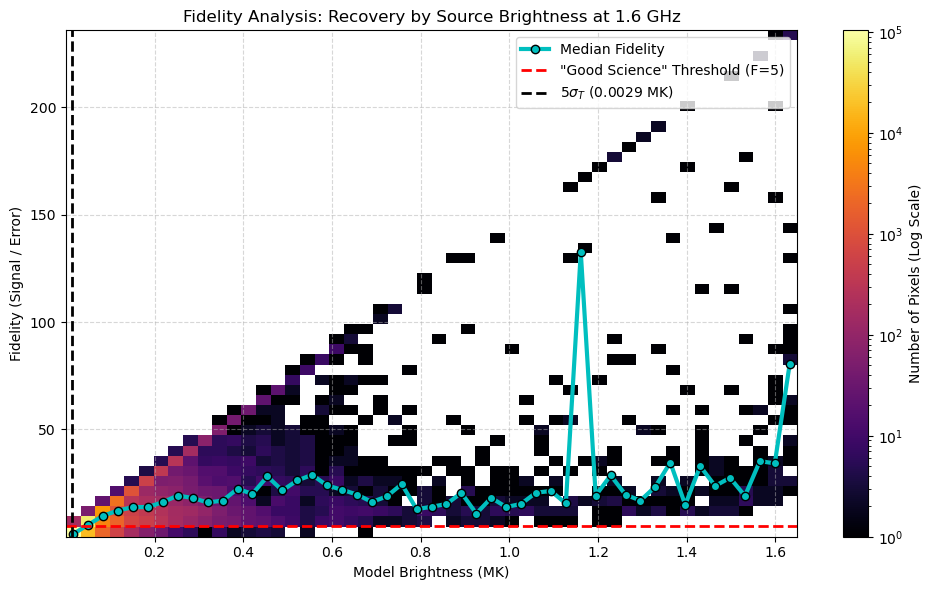

Using model: ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.04.84GHz.I.masked.fits
Total flux within primary beam used to calcuate the antenna temperature: 93.3 sfu
Tant: 358K
93.29310625
Calculate antenna temperature from total flux 93.29310625 sfu incident on the dish
Total noise temperature (K): 6.582e+02 K
Estimated SEFD: 1.842e+06 Jy
Estimated natural weighting point source sensitivity sigma_na: 2.225e+00 Jy/beam
Estimated uniform weighting point source sensitivity sigma_un: 2.490e+00 Jy/beam
Estimated noise per baseline per channel per polarization per integration: 2.659e+02 Jy for 7140 baselines
Start plotting
Applying a mask of 1.2 solar radii to calculate rms outside of it.
Peak of fasr_fasr-a_random_spiral_hybrid_120_Active_Region_5GHz_20210630T18UT_dur1s_int1s_noise300K_phaerr5.7deg_amperr10pct_multiscale.image: 2.281e+06 K
rms of fasr_fasr-a_random_spiral_hybrid_120_Active_Region_5GHz_20210630T18UT_dur1s_int1s_noise300K_phaerr5.7deg_amperr10

/Users/binchen/Dropbox/Projects/FASR/fasr-array-config-simul/fasr_solar_simul.py:3056: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(ctick_labels)
/Users/binchen/Dropbox/Projects/FASR/fasr-array-config-simul/fasr_solar_simul.py:3105: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(ctick_labels)


'plot_two_casa_images_with_convolution' completed at 2026-03-06 07:26:09; runtime: 0.44 seconds
FASR-A/msfiles/Active_Region/fasr_fasr-a_random_spiral_hybrid_120_Active_Region_5GHz_20210630T18UT_dur1s_int1s_noise300K_phaerr5.7deg_amperr10pct_multiscale.image
FASR-A/msfiles/Active_Region/AR_20210630_model_eofreq.04.84GHz.I.masked.im
Start fidelity evaluation


2026-03-06 12:26:10	WARN	imregrid::ImageRegrid::regrid	You are regridding an image whose beam is not well sampled by the pixel size.  Total flux can be lost when regridding such images, especially when the new pixel size is larger than the old pixel size. It is recommended to check the total flux of your input and output image, and if necessary rebin the input to have smaller pixels.


RMS noise in the restored image: 13.0
Fidelity Image Statistics - Peak: 306.02, Mean: 1.33, Median: 1.20, Std Dev: 2.17, SNR: 315.60


/Users/binchen/Dropbox/Projects/FASR/fasr-array-config-simul/fasr_solar_simul.py:2734: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(ctick_labels)


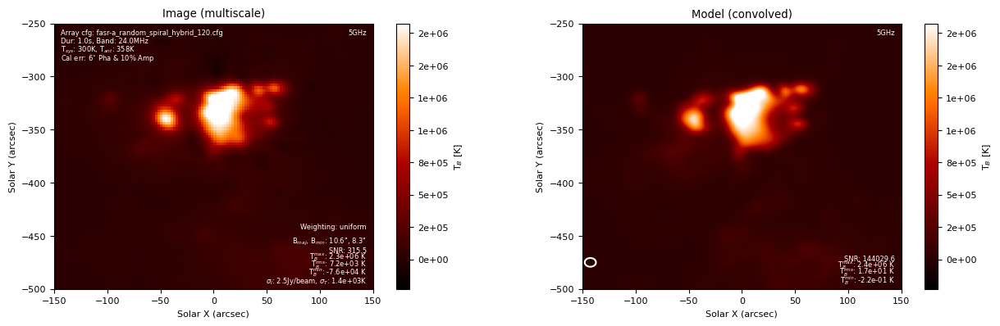

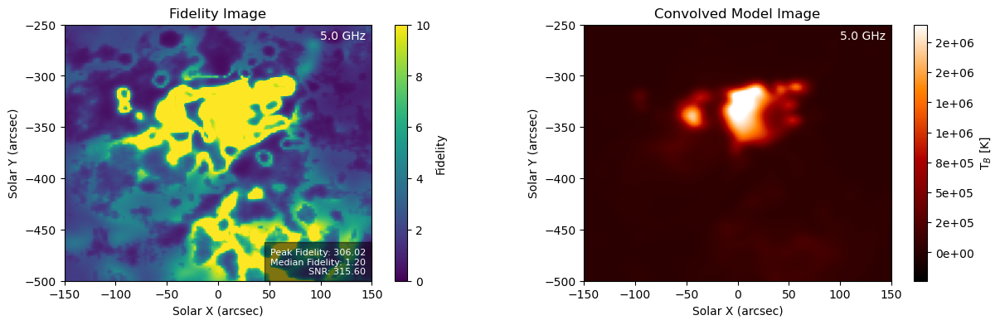

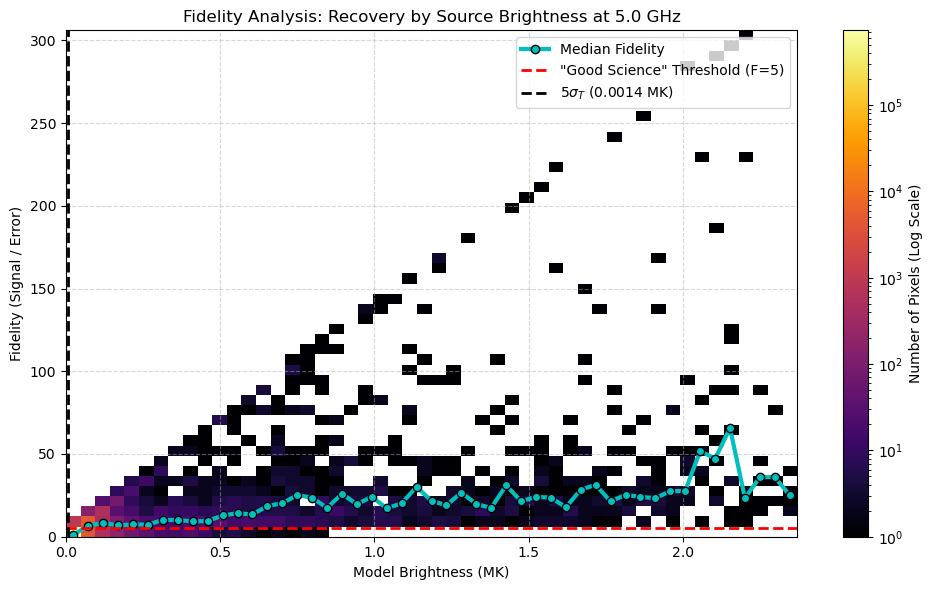

Using model: ../fasr_sim/skymodels/active_region/AR_20210630_eofreq/AR_20210630_model_eofreq.10.04GHz.I.masked.fits
Total flux within primary beam used to calcuate the antenna temperature: 275.5 sfu
Tant: 1058K
275.515675
Calculate antenna temperature from total flux 275.515675 sfu incident on the dish
Total noise temperature (K): 1.358e+03 K
Estimated SEFD: 3.801e+06 Jy
Estimated natural weighting point source sensitivity sigma_na: 4.591e+00 Jy/beam
Estimated uniform weighting point source sensitivity sigma_un: 4.811e+00 Jy/beam
Estimated noise per baseline per channel per polarization per integration: 5.486e+02 Jy for 7140 baselines
Start plotting
Applying a mask of 1.2 solar radii to calculate rms outside of it.
Peak of fasr_fasr-a_random_spiral_hybrid_120_Active_Region_10GHz_20210630T18UT_dur1s_int1s_noise300K_phaerr5.7deg_amperr10pct_multiscale.image: 2.809e+06 K
rms of fasr_fasr-a_random_spiral_hybrid_120_Active_Region_10GHz_20210630T18UT_dur1s_int1s_noise300K_phaerr5.7deg_amperr

/Users/binchen/Dropbox/Projects/FASR/fasr-array-config-simul/fasr_solar_simul.py:3056: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(ctick_labels)
/Users/binchen/Dropbox/Projects/FASR/fasr-array-config-simul/fasr_solar_simul.py:3105: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(ctick_labels)


'plot_two_casa_images_with_convolution' completed at 2026-03-06 07:26:14; runtime: 0.62 seconds
FASR-A/msfiles/Active_Region/fasr_fasr-a_random_spiral_hybrid_120_Active_Region_10GHz_20210630T18UT_dur1s_int1s_noise300K_phaerr5.7deg_amperr10pct_multiscale.image
FASR-A/msfiles/Active_Region/AR_20210630_model_eofreq.10.04GHz.I.masked.im
Start fidelity evaluation


2026-03-06 12:26:15	WARN	imregrid::ImageRegrid::regrid	You are regridding an image whose beam is not well sampled by the pixel size.  Total flux can be lost when regridding such images, especially when the new pixel size is larger than the old pixel size. It is recommended to check the total flux of your input and output image, and if necessary rebin the input to have smaller pixels.


RMS noise in the restored image: 24.5
Fidelity Image Statistics - Peak: 326.27, Mean: 1.17, Median: 1.07, Std Dev: 1.71, SNR: 388.61


/Users/binchen/Dropbox/Projects/FASR/fasr-array-config-simul/fasr_solar_simul.py:2734: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar.ax.set_yticklabels(ctick_labels)


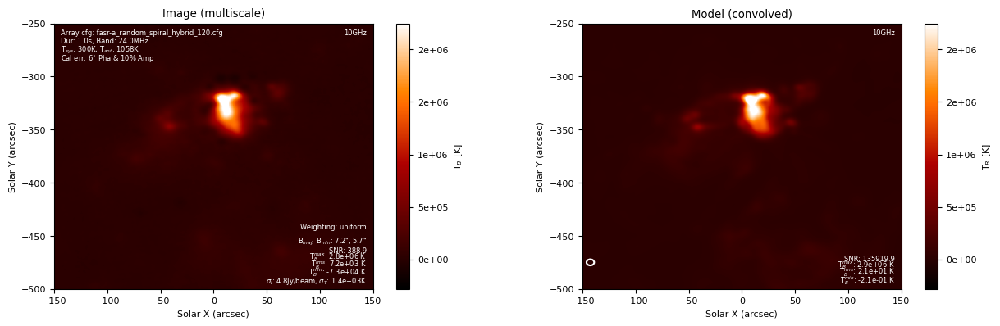

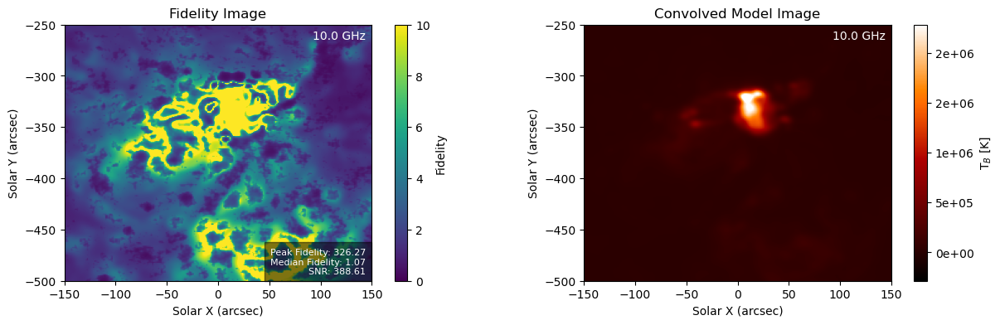

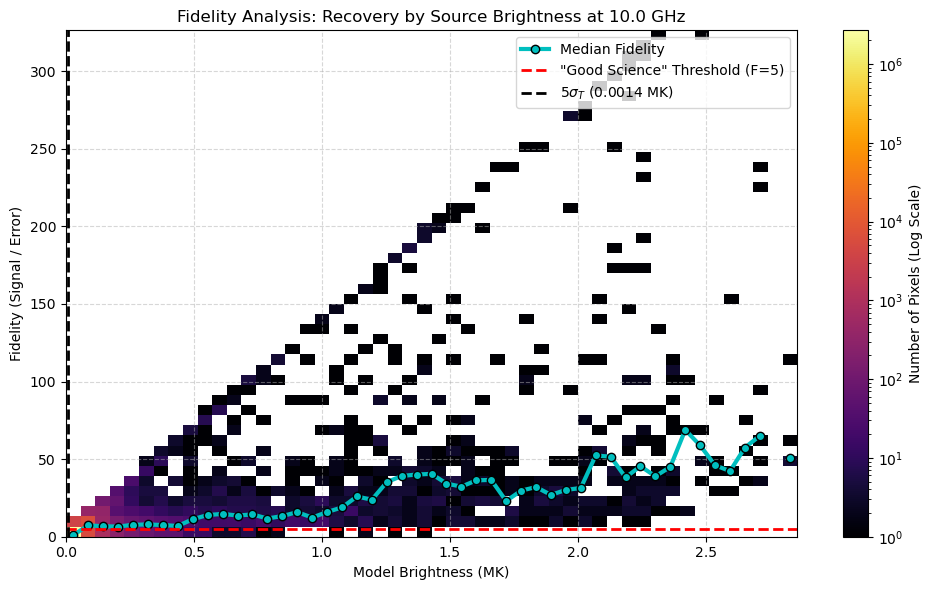

In [54]:
%matplotlib inline
reload(fss)
import glob

import time

reftime_casa = Time(reftime).strftime('%Y/%m/%d/%H:%M:%S')

figdir = os.path.join(project, figsubfolder)
if not os.path.exists(figdir):
    os.makedirs(figdir)
    
caltbdir = os.path.join(project, 'caltbs')
if not os.path.exists(caltbdir):
    os.makedirs(caltbdir)

for config_file in config_files:
    cfg_suffix = os.path.basename(config_file.rstrip(".cfg"))
    for freqstr, imsize, cell, scale in zip(freq_list, imsizes, cells, scales):
        # Find the model file with the correct frequency
        solar_model_candidates = glob.glob(f'{model_dir}/{model_prefix}*.I.masked.fits')
        solar_model = None
        all_freqs_ghz = []
        for candidate in solar_model_candidates:
            hdul = fits.open(candidate)
            header = hdul[0].header
            all_freqs_ghz.append(header['CRVAL3'] / 1e9)
        all_freqs_ghz = np.array(all_freqs_ghz)
        freq_idx = np.argmin(np.abs(all_freqs_ghz - float(freqstr.rstrip('GHz'))))
        freq_diff = np.min(np.abs(all_freqs_ghz - float(freqstr.rstrip('GHz'))))
        if freq_diff / float(freqstr.rstrip('GHz')) > 0.1:
            print(f'Warning: No model found for {freqstr} with 10% accuracy')
            continue
        solar_model = solar_model_candidates[freq_idx]
        print(f'Using model: {solar_model}')

        for tsys in tsys_all:
            # Calculate theoretical sensitivity with natural weighting
            antenna_params = np.genfromtxt(config_file, comments='#')
            dish_diameter = antenna_params[0, 3]
            uv_cell = 1. / (imsize * float(cell.rstrip('arcsec')) / 206265.)
            total_flux = fss.calc_total_flux_on_dish(solar_model, dish_diameter=dish_diameter, freqghz=freqstr)
            tant = fss.total_flux_to_tant(total_flux, eta_a=0.6, dish_diameter=dish_diameter)
            print(f'Tant: {tant:.0f}K')
            noisejy, sigma_na, sigma_un = fss.calc_noise(tsys, config_file, dish_diameter=dish_diameter, 
                                                         total_flux=total_flux, duration=duration,
                                                         integration_time=integration_time, 
                                                         channel_width_mhz=channel_width_mhz, 
                                                         freqghz=freqstr, uv_cell=uv_cell)
            sigma_jy = sigma_un / np.sqrt((duration / integration_time))
                
            for phaerr, amperr in cal_errors:
                phaerr_deg = np.rad2deg(phaerr)
                gaintable = [f'caltb_FASR_corrupt_{phaerr_deg:.0f}deg.ph',
                             f'caltb_FASR_corrupt_{np.int_(amperr * 100)}pct.amp']
                msname = fss.make_msname(project, target, freqstr, Time(reftime).datetime, duration, integration_time, config_file, tsys)
                imname = fss.make_imname(msname, deconvolver, phaerr, amperr)
                if niter == 0:
                    imname = imname.replace(deconvolver, 'dirty')
                msfile = f'{msname}.ms'
                if os.path.exists(msfile):
                    if overwrite_ms:
                        os.system('rm -rf ' + msfile)
                    else:
                        pass
                
                if not os.path.exists(msfile):
                    print('Start generating ms')
                    msfile = fss.generate_ms(config_file, solar_model, reftime_casa, freqstr, integration_time=integration_time,
                                    duration=duration, channel_width_mhz=channel_width_mhz, 
                                    msname=msfile, tsys=tsys, usehourangle=True)

                if os.path.exists(f'{imname}.image'):
                    if overwrite_im:
                        junk = ['.image', '.model', '.mask', '.pb', '.psf', '.residual', '.sumwt']
                        for j in junk:
                            os.system(f'rm -rf {imname}{j}')

                if not os.path.exists(f'{imname}.image'):
                    tstart = time.time()
                    print('Start deconvolution')
                    if not os.path.exists(gaintable[0]):
                        gaintable = fss.generate_caltb(msfile, caltype=['ph', 'amp'], 
                                                       calerr=[phaerr, amperr], caltbdir=caltbdir)
                    clearcal(vis=msfile)
                    applycal(vis=msfile, gaintable=gaintable, applymode='calonly', calwt=False)
                    if deconvolver == 'hogbom':
                        tclean(vis=msfile, imagename=imname,
                               datacolumn='corrected',
                               field='', spw='', specmode='mfs', 
                               deconvolver=deconvolver, pblimit=0.01,
                               imsize=imsize, cell=cell,
                               weighting=weighting,
                               niter=niter,
                               interactive=False)
                    elif deconvolver == 'multiscale':
                        tclean(vis=msfile, imagename=imname,
                               datacolumn='corrected',
                               field='', spw='', specmode='mfs', 
                               deconvolver=deconvolver, scales=scale, 
                               gain=0.2, cycleniter=200, minpsffraction=0.1, pblimit=0.01,
                               imsize=imsize, cell=cell,
                               weighting=weighting,
                               niter=niter,
                               interactive=False)                        
                    junk = ['.model', '.mask', '.pb', '.psf', '.residual', '.sumwt']
                    for j in junk:
                        os.system(f'rm -rf {imname}{j}')
                    tend = time.time()
                    print(f'deconvolution completed in {(tend - tstart)/60.:.2f} minutes')
                    

                figname = os.path.join(figdir, f'fig-{os.path.basename(imname)}.jpg')
                #figname = os.path.join(figdir, f'fig-{os.path.basename(imname)}.ar.jpg')
                if os.path.exists(figname):
                    if overwrite_plot:
                        os.system(f'rm -rf {figname}')

                if not os.path.exists(figname):
                    reload(fss)
                    ## cleaned image
                    image1 = imname + '.image'
                    ## model image
                    image2 = os.path.join(project+'/msfiles/Active_Region/', os.path.basename(solar_model.replace('.fits', '.im')))
                    hdul = fits.open(solar_model)
                    header = hdul[0].header
                    radius_cutoff_rsun = header['RADCUT'] / solar_radius_asec
                    hdul.close()
                    ## meta information of the images
                    image_meta = {'title': [f'Image ({deconvolver})', 'Model (convolved)'],
                                  'freq': freqstr.lstrip("0"),
                                  'array_config': config_file,
                                  'tsys': f'{tsys:.0f}K',
                                  'tant': f'{tant:.0f}K',
                                  'sigma_jy': f'{sigma_jy:.1f}Jy/beam',
                                  'cal_error': f'{phaerr_deg:.0f}'+r'$^{\circ}$ Pha' + f' & {np.int_(amperr * 100)}% Amp',
                                  'duration': f'{duration}s',
                                  'bandwidth': f'{channel_width_mhz}MHz',
                                  'weighting': weighting,
                                  }
                    print('Start plotting')
                    fig, axs = fss.plot_two_casa_images_with_convolution(image1, image2,
                                                                         crop_fraction=(0.0, 1.0),
                                                                         rms_mask_radius=radius_cutoff_rsun,
                                                                         reftime=reftime,
                                                                         figsize=(13, 4), 
                                                                         image_meta=image_meta,
                                                                         cmap='hinodexrt',
                                                                         vmin=-10, vmax=80,
                                                                         contour_levels=[0.025, 0.05, 0.1, 0.2, 0.4,
                                                                                         0.8],
                                                                         conv_tag=f'.{cfg_suffix}',
                                                                         overwrite_conv=False,
                                                                         #xlim=[-300, 300], ylim=[-600, -200])
                                                                         xlim=[-150, 150], ylim=[-500, -250])

                    fig.savefig(figname, dpi=300)
                    print(image1)
                    print(image2)
                    
                    # Plot fidelity map
                    print('Start fidelity evaluation')
                    fidelity_image, noise_floor, peak, fig_f, axs_f, fig_stat = fss.fidelity_evaluation(image1, image2.replace('.im', f'.{cfg_suffix}.im.convolved'),
                                       fidelity_image=image1 + '.fidelity', fontsize=10, sigma_jy=sigma_jy,
                                       doconvolve=False, rms_mask_radius=radius_cutoff_rsun, do_plot=True, figsize=(13, 4), vmin=-10, vmax=80,
                                       #xlim=[-300, 300], ylim=[-600, -200])
                                       xlim=[-150, 150], ylim=[-500, -250])
                    fig_f.savefig(figname.replace('.jpg', '.fidelity.jpg'), dpi=300)
                    fig_stat.savefig(figname.replace('.jpg', '.fidelity.stat.jpg'), dpi=300)
                    